# <div style='padding:25px;background-color:maroon;color:white;border-radius:4px;font-size:100%;text-align: center'>Banking Data Analysis<br></div>

## <span style="color:Aqua;">Importing libraries from Python</span>

In [6]:
import pandas as pd
pd.options.display.max_columns = 50
pd.set_option("display.precision", 4)
pd.set_option('display.float_format', '{:.4f}'.format)


import numpy as np
import os
import math
from scipy.stats import pearsonr,kstest, norm, skew,kurtosis, boxcox
from statsmodels.formula.api import ols
import statsmodels.api as sm
import scipy.stats as stats
import pickle

import seaborn as sns
sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)
sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})

import matplotlib.pyplot as plt
plt.rcParams.update({
    'text.color': 'black',  # Change font color
    'axes.labelcolor': 'black',  # Change axis label color
    'xtick.color': 'black',  # Change x-tick color
    'ytick.color': 'black',  # Change y-tick color
    'font.weight': 'bold',  # Change font weight
    'axes.titleweight': 'bold',  # Change title weight
    'axes.labelweight': 'bold',# Change label weight
})


color_good = '\033[32m'   # Dark Green for near-zero skew
color_okay = '\033[92m'   # Light Green for slightly positive or slightly negative skew
color_bad = '\033[91m'    # Maroon for significant skew
color_neutral = '\033[0m' # Reset color


---
title: "Data Transformation"
author: "Santhoh Kumar"
format:
  html:
    toc: true
    html-math-method: katex
    css: styles.css
---


### <span style="color:Khaki;">Reading Feature Engineered Dataset:

In [3]:
df=pd.read_feather('feature_engineerd_data.feather')

In [4]:
df.sample(5)

,age,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,credit_mix,outstanding_debt,credit_utilization_ratio,credit_history_age,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score,Mortgage Loan,Home Equity Loan,Credit-Builder Loan,Payday Loan,Personal Loan,Debt Consolidation Loan,Student Loan,Auto Loan,debt_income_ratio,loan_income_ratio_month,credit_utilization_per_account,credit_inquiry_per_loan,age_group,delayed_payment_ratio,investment_to_income_ratio,credit_limit_change_rate,total_credit_exposure,credit_utilization_to_income_ratio,savings_rate,reliable_payment,disposable_income,income_stability,total_liability,debt_paytime
50057,28,Teacher,20616.6300,1784.0525,6,6,15,6,32,19,22,10.0000,Bad,3389.0400,36,126,Yes,70.5730,38.6974,Low_Spent_Large_Value_Payments,308.9386,Standard,0,0,1,0,1,1,0,1,1585.8946,24.9263,5.1429,2.0000,26-35,2.7143,0.0217,0.1732,3425.0400,0.0017,0.0217,15.0794,1713.4795,1.0384,3459.6130,47.3508
26725,17,Engineer,46717.3200,4072.1100,9,6,25,7,33,17,8,9.0000,Bad,2687.2100,38,104,Yes,176.1264,40.9484,High_Spent_Medium_Value_Payments,397.1009,Poor,1,0,1,1,0,1,1,0,3336.9514,22.9899,3.8000,2.0000,<18,2.1250,0.0101,0.0762,2725.2100,0.0008,0.0101,16.3462,3895.9836,1.0460,2863.3364,15.1711
78750,37,Developer,42252.7000,3007.4906,6,6,13,4,8,20,7,4.0000,Standard,718.3600,35,345,Yes,492.6176,43.5460,Low_Spent_Large_Value_Payments,268.8432,Good,1,0,0,0,1,0,1,0,3841.1545,6.0928,5.0000,1.0000,36-50,4.0000,0.0145,0.0202,753.3600,0.0008,0.0145,5.7971,2514.8730,0.8541,1210.9776,1.4553
90171,37,Architect,109782.3200,9439.5267,4,4,19,2,27,10,7,0.0000,Standard,426.4000,36,341,No,92.5267,114.7727,Low_Spent_Medium_Value_Payments,415.6485,Standard,0,0,0,0,0,0,1,0,15683.1886,100.9287,7.2000,0.0000,36-50,3.3333,0.0122,0.0205,462.4000,0.0003,0.0122,2.9326,9347.0000,1.0318,518.9267,4.5591
18789,25,Scientist,9988.7600,999.3967,4,7,5,1,22,14,19,6.0000,Standard,71.4200,24,301,Yes,4.8657,29.5694,Low_Spent_Small_Value_Payments,257.8371,Standard,0,0,1,0,0,0,0,0,1109.8622,170.3801,4.8000,3.0000,18-25,7.0000,0.0296,0.0629,95.4200,0.0024,0.0296,4.6512,994.5310,1.2006,76.2857,12.1759


## <span style="color:Aqua;">Defining variable type</span> 

In [5]:
continuous = ['age', 'annual_income', 'monthly_inhand_salary','delay_from_due_date','interest_rate', 'outstanding_debt', 'credit_utilization_ratio', 
                   'credit_history_age', 'total_emi_per_month', 'amount_invested_monthly', 'monthly_balance','changed_credit_limit', 
                    'debt_income_ratio', 'loan_income_ratio_month', 'credit_utilization_per_account', 'reliable_payment',
                  'delayed_payment_ratio', 'investment_to_income_ratio','credit_limit_change_rate', 'total_credit_exposure', 'credit_utilization_to_income_ratio', 
                   'savings_rate',  'income_stability', 'total_liability', 'debt_paytime']

In [6]:
for i in continuous:
    print(i, '>>', df[i].min(), '----',df[i].max())

age >> 14 ---- 56
annual_income >> 7005.93 ---- 179987.28
monthly_inhand_salary >> 303.6454166666666 ---- 15204.633333333331
delay_from_due_date >> 0 ---- 62
interest_rate >> 1 ---- 34
outstanding_debt >> 0.23 ---- 4998.07
credit_utilization_ratio >> 20 ---- 50
credit_history_age >> 1 ---- 404
total_emi_per_month >> 0.0 ---- 1779.1032538262775
amount_invested_monthly >> 0.0 ---- 434.1910893520318
monthly_balance >> 0.0077596647753352 ---- 1183.9306960885192
changed_credit_limit >> 0 ---- 29
debt_income_ratio >> 366.54724999999996 ---- 101912.13
loan_income_ratio_month >> 0.5049622947689958 ---- 15101.94
credit_utilization_per_account >> 1.8181818181818181 ---- 50.0
reliable_payment >> 0.0 ---- 2500.0
delayed_payment_ratio >> 0.0 ---- 23.0
investment_to_income_ratio >> 0.0 ---- 0.0653688518448969
credit_limit_change_rate >> 0.0 ---- 10.0
total_credit_exposure >> 21.95 ---- 5036.07
credit_utilization_to_income_ratio >> 0.0001224152600764664 ---- 0.005810324095626597
savings_rate >> 0.0 -

## <p Style="color: Aqua"> Data Transformation:

### <p Style="color: Khaki">Experimenting with a few types of data transformation techniques to see which one suits best.

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%"> Defining a function to create plots.</span></span><br>

In [41]:
def univar_num(df, col):
    plt.figure(figsize=(16, 8))
    df = df.dropna(subset=[col])


    mean=df[col].mean()
    median=df[col].median()
    mode=df[col].mode()[0]
    sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})
    plt.subplot(2, 3, 1)
    sns.histplot(data=df, x=col, kde=True, bins=20,color='maroon',fill=True)
    plt.title(f'Histogram for {col}',fontdict={'fontsize':22,'color':'black','fontweight':'bold'})
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)

    
    plt.legend()
    plt.tight_layout()
    
    plt.subplot(2, 3, 2)
    sns.boxplot(data=df, x=col, color='lightgrey',legend=True)
    plt.xticks(rotation=45)
    plt.title(f'Box Plot for {col}',fontdict={'fontsize':22,'color':'black','fontweight':'bold'})
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    plt.legend()
    plt.tight_layout()

    
    plt.subplot(2, 3, 3)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.gca().get_lines()[1].set_color('maroon')
    plt.gca().get_lines()[0].set_color('darkgreen')
    plt.title(f'QQ Plot for {col}',fontdict={'fontsize':22,'color':'black','fontweight':'bold'})

    plt.tight_layout()
    
    plt.tight_layout()
    plt.show()

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%"> Defining a function to apply trasformation.</span></span><br>

In [8]:

# Defining a function to perform Box-Cox
def boxcox_transform(x):
    transformed_data,lmbda = boxcox(x + np.spacing(1))
    return transformed_data,lmbda

method_functions =  {
    'log': lambda x: np.log(x + np.spacing(1)),
    'square': np.sqrt,
    'rec': lambda x: np.where(x != 0, 1 / x, np.spacing(1)),
    'sig': lambda x: 1 / (1 + np.exp(-x)),
    'cube': lambda x: np.power(x, 3),
    'exp':lambda x: x**(1/5),
    'boxcox': boxcox_transform,
        }

def skewness_checker(df, column, method,pkl_path=None):
    transformed_columns = {}
    transformation_params = {}

    for method_name, func in method_functions.items():
        for col in column:

            new_column = f'{col}_{method_name}'
            if method_name == 'boxcox':
                transformed_values, lmbda = func(df[col])
                transformation_params[new_column] = lmbda 
            else:
                transformed_values = func(df[col])
            transformed_columns[new_column] = transformed_values
    normalized_df = pd.DataFrame(transformed_columns)
    if not os.path.exists(pkl_path):
        os.makedirs(pkl_path)
    file_path = os.path.join(pkl_path,'transformation_params.pkl')
    with open(file_path, 'wb') as f:
        pickle.dump(transformation_params, f)
        
    return normalized_df, transformation_params

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%">Creating a new Data Frame that contains transformed values:

In [9]:
normalized_df, params = skewness_checker(df, continuous, method_functions,pkl_path='pkls/transformation_params.pkl')
normalized_df.sample(5)

,age_log,annual_income_log,monthly_inhand_salary_log,delay_from_due_date_log,interest_rate_log,outstanding_debt_log,credit_utilization_ratio_log,credit_history_age_log,total_emi_per_month_log,amount_invested_monthly_log,monthly_balance_log,changed_credit_limit_log,debt_income_ratio_log,loan_income_ratio_month_log,credit_utilization_per_account_log,reliable_payment_log,delayed_payment_ratio_log,investment_to_income_ratio_log,credit_limit_change_rate_log,total_credit_exposure_log,credit_utilization_to_income_ratio_log,savings_rate_log,income_stability_log,total_liability_log,debt_paytime_log,...,age_boxcox,annual_income_boxcox,monthly_inhand_salary_boxcox,delay_from_due_date_boxcox,interest_rate_boxcox,outstanding_debt_boxcox,credit_utilization_ratio_boxcox,credit_history_age_boxcox,total_emi_per_month_boxcox,amount_invested_monthly_boxcox,monthly_balance_boxcox,changed_credit_limit_boxcox,debt_income_ratio_boxcox,loan_income_ratio_month_boxcox,credit_utilization_per_account_boxcox,reliable_payment_boxcox,delayed_payment_ratio_boxcox,investment_to_income_ratio_boxcox,credit_limit_change_rate_boxcox,total_credit_exposure_boxcox,credit_utilization_to_income_ratio_boxcox,savings_rate_boxcox,income_stability_boxcox,total_liability_boxcox,debt_paytime_boxcox
8451,3.6109,11.3745,8.8951,2.4849,2.3026,5.9430,3.5553,5.7104,-36.0437,4.0127,6.7431,2.4849,9.2950,8.8951,1.3581,1.3796,2.4849,-4.8825,-3.2288,6.0308,-7.8191,-4.8823,0.0055,5.9430,5.9430,...,12.3270,15.2767,13.2646,3.8411,4.3379,20.1264,17.2607,165.6512,-5.7584,8.2462,29.9790,3.8114,9.5880,2.3443,0.8468,1.6008,3.6892,-2.0855,-2.3751,17.3367,-10.7369,-2.0860,0.0055,17.0399,5.5299
65717,3.5264,10.6008,8.1854,2.9957,3.1355,7.5026,3.6636,4.7958,4.4716,3.9936,6.0509,2.1972,8.2029,3.7024,1.7177,2.3743,0.9555,-4.1921,-2.6068,7.5239,-6.9372,-4.1918,0.0695,7.5498,3.0197,...,11.6528,13.9432,11.8031,5.0987,7.6253,36.8959,18.8051,73.9784,6.7542,8.1761,22.6037,3.1986,8.4305,1.8886,0.9588,3.0798,1.1063,-1.9810,-2.0289,29.2171,-9.1774,-1.9814,0.0721,30.0575,2.9105
31177,4.0073,10.8156,8.3090,3.1355,2.7081,6.9290,3.3322,5.2983,4.1444,3.9837,6.2901,1.0986,8.7361,4.1489,1.3863,1.5041,1.0986,-4.3255,-4.2047,6.9561,-7.4834,-4.3253,-0.0217,6.9889,2.7689,...,15.9700,14.3083,12.0514,5.4811,5.7674,29.6404,14.4393,115.2954,6.0637,8.1401,24.9424,1.3187,8.9947,1.9759,0.8567,1.7693,1.3010,-2.0036,-2.8380,24.0527,-10.1306,-2.0040,-0.0214,24.7658,2.6769
55020,3.7842,11.1362,8.6640,2.8332,1.6094,7.0177,3.3322,5.4381,4.4936,3.7833,5.7928,1.7918,9.3445,4.1593,1.9459,-36.0437,-36.0437,-4.8809,-3.6507,7.0424,-7.8040,-4.8807,0.0127,7.0947,2.5130,...,13.8166,14.8606,12.7791,4.6755,2.4772,30.6683,14.4393,130.3887,6.8020,7.4338,20.3014,2.4262,9.6406,1.9777,1.0155,-4.7506,-3.3382,-2.0853,-2.5864,24.7818,-10.7093,-2.0858,0.0128,25.6953,2.4371
4472,3.7377,10.3864,7.9191,2.1972,2.9957,6.5448,3.4657,5.0626,3.5357,3.7028,6.0224,2.7081,8.3069,4.3547,1.3863,2.4870,1.8458,-4.2166,-2.3609,6.5898,-6.9206,-4.2162,0.0176,6.5929,2.9804,...,13.4018,13.5826,11.2769,3.2204,6.9734,25.5370,16.0717,93.6588,4.8788,7.1629,22.3383,4.3275,8.5404,2.0110,0.8567,3.2677,2.4648,-1.9852,-1.8796,21.1655,-9.1490,-1.9856,0.0178,21.5443,2.8740


#### <p Style="color: Aqua"> Plotting all type of transformed values:

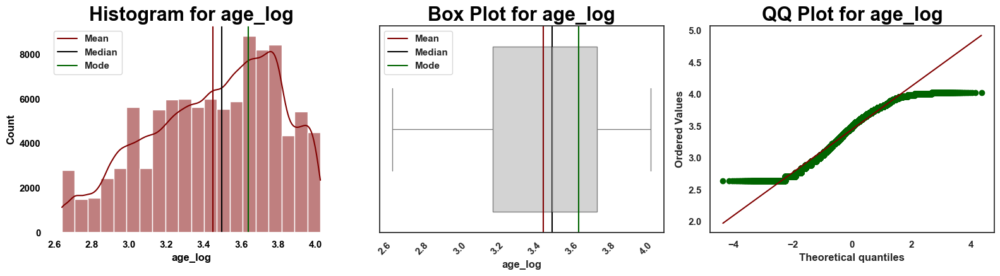



Skew for age_log is -0.39

Kurtosis for age_log is -0.74




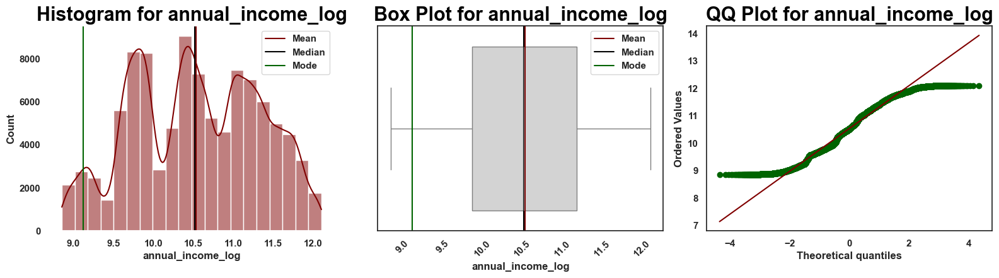



Skew for annual_income_log is -0.08

Kurtosis for annual_income_log is -0.92




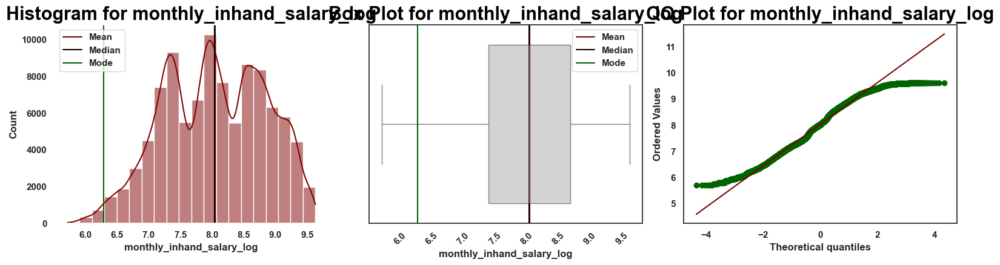



Skew for monthly_inhand_salary_log is -0.14

Kurtosis for monthly_inhand_salary_log is -0.78




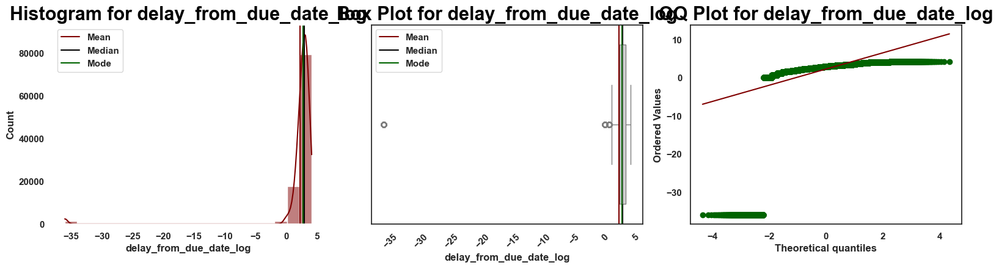



Skew for delay_from_due_date_log is -7.93

Kurtosis for delay_from_due_date_log is 62.89




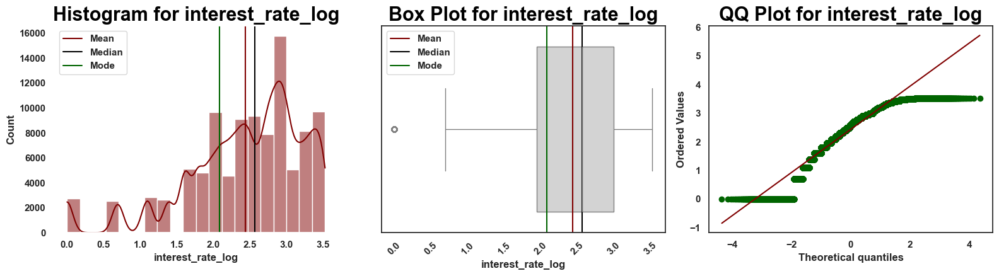



Skew for interest_rate_log is -1.02

Kurtosis for interest_rate_log is 0.98




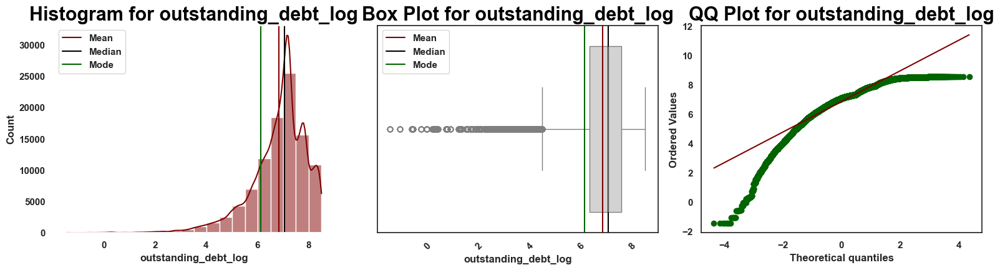



Skew for outstanding_debt_log is -1.41

Kurtosis for outstanding_debt_log is 3.78




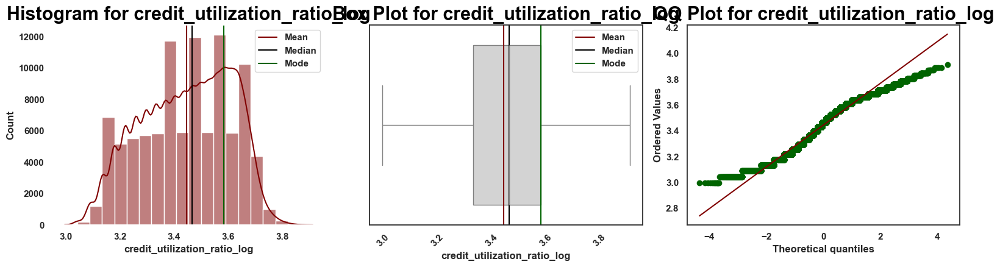



Skew for credit_utilization_ratio_log is -0.23

Kurtosis for credit_utilization_ratio_log is -0.90




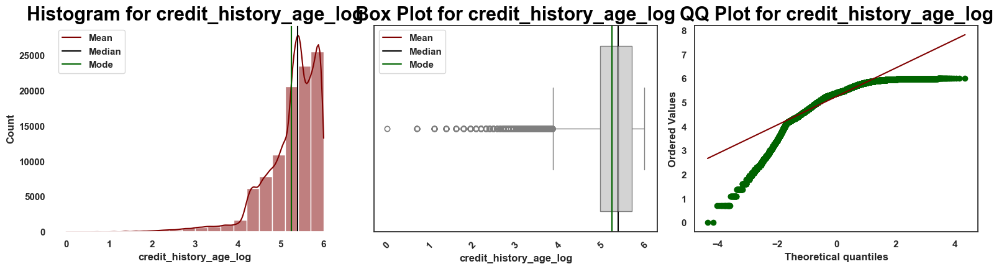



Skew for credit_history_age_log is -1.82

Kurtosis for credit_history_age_log is 5.13




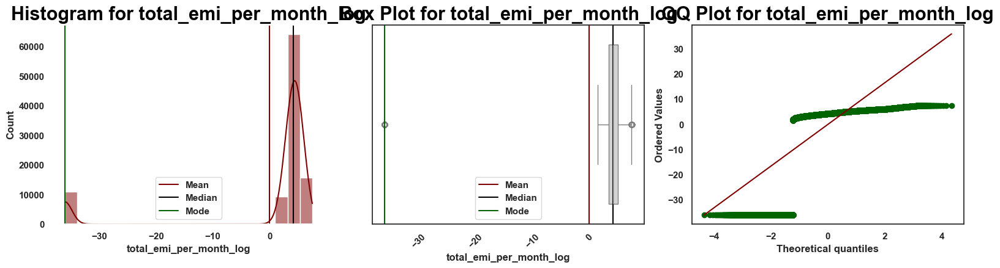



Skew for total_emi_per_month_log is -2.47

Kurtosis for total_emi_per_month_log is 4.16




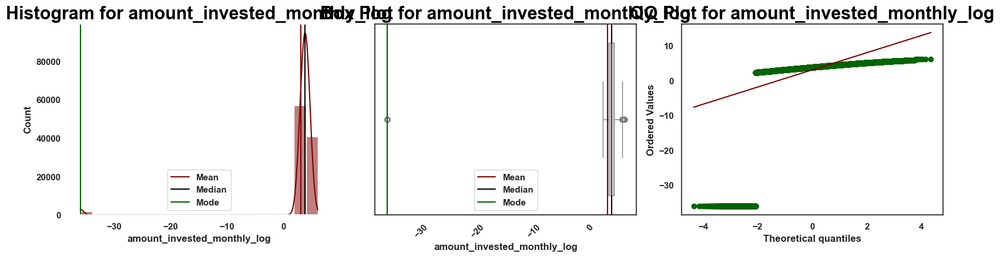



Skew for amount_invested_monthly_log is -6.86

Kurtosis for amount_invested_monthly_log is 45.76




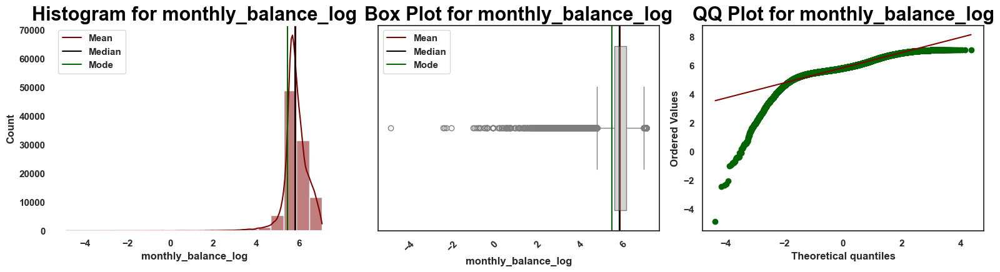



Skew for monthly_balance_log is -1.99

Kurtosis for monthly_balance_log is 15.44




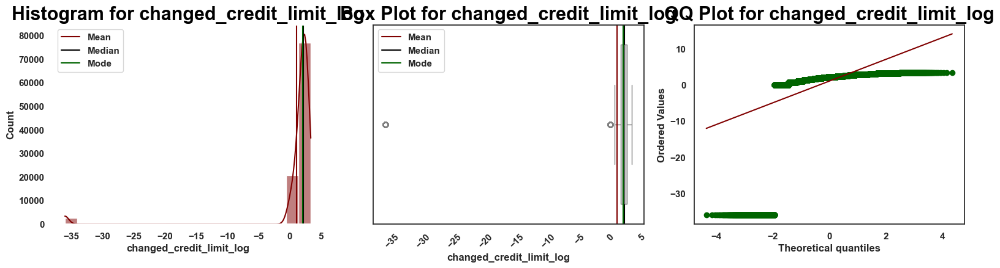



Skew for changed_credit_limit_log is -5.78

Kurtosis for changed_credit_limit_log is 32.00




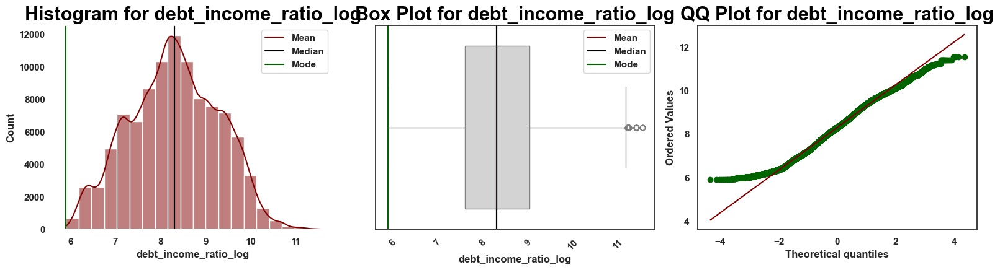



Skew for debt_income_ratio_log is -0.02

Kurtosis for debt_income_ratio_log is -0.56




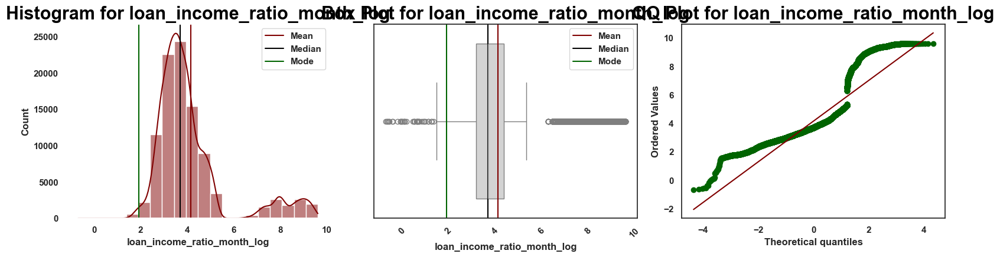



Skew for loan_income_ratio_month_log is 1.83

Kurtosis for loan_income_ratio_month_log is 2.77




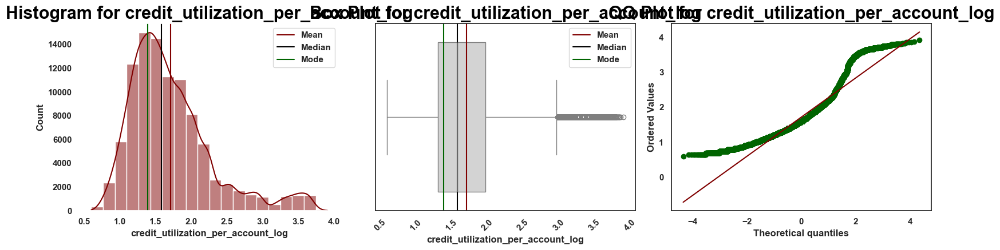



Skew for credit_utilization_per_account_log is 1.27

Kurtosis for credit_utilization_per_account_log is 1.72




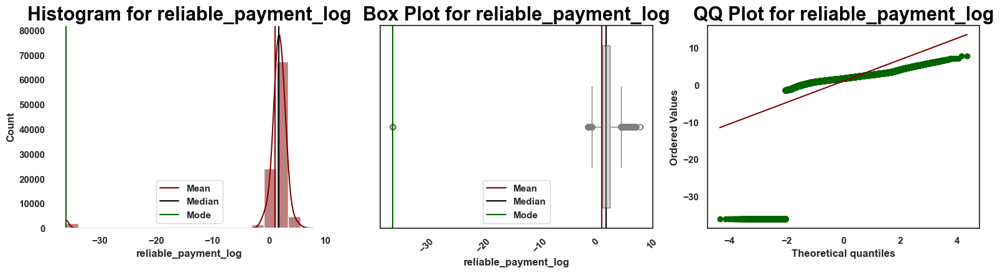



Skew for reliable_payment_log is -6.33

Kurtosis for reliable_payment_log is 39.72




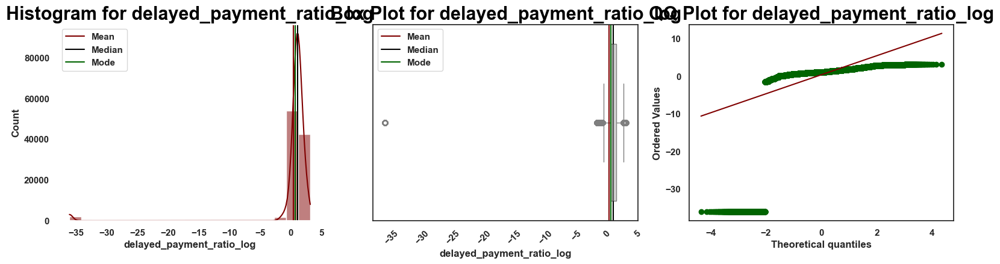



Skew for delayed_payment_ratio_log is -6.52

Kurtosis for delayed_payment_ratio_log is 41.39




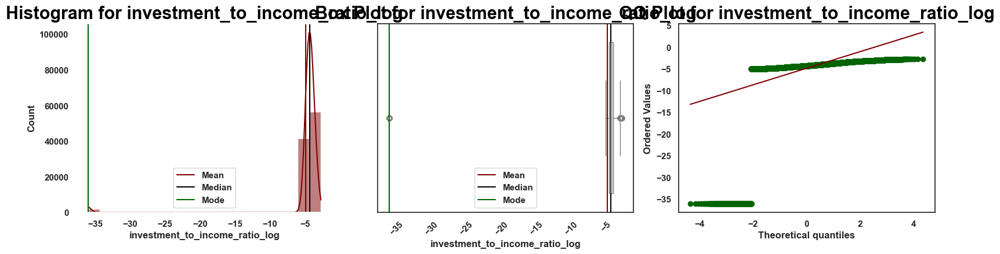



Skew for investment_to_income_ratio_log is -6.89

Kurtosis for investment_to_income_ratio_log is 46.04




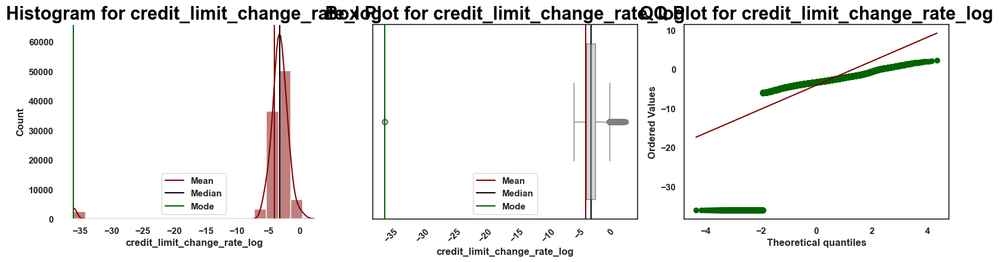



Skew for credit_limit_change_rate_log is -5.50

Kurtosis for credit_limit_change_rate_log is 29.90




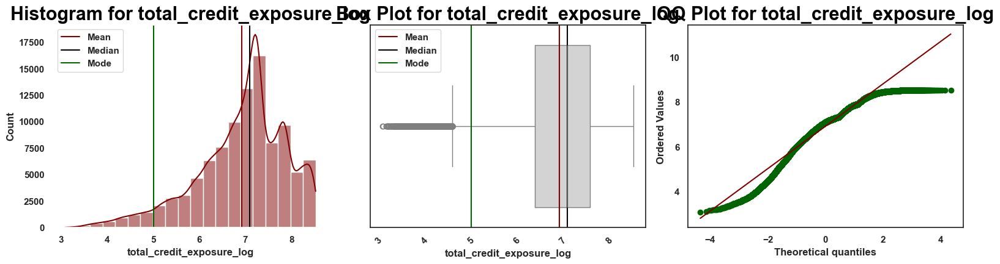



Skew for total_credit_exposure_log is -0.82

Kurtosis for total_credit_exposure_log is 0.65




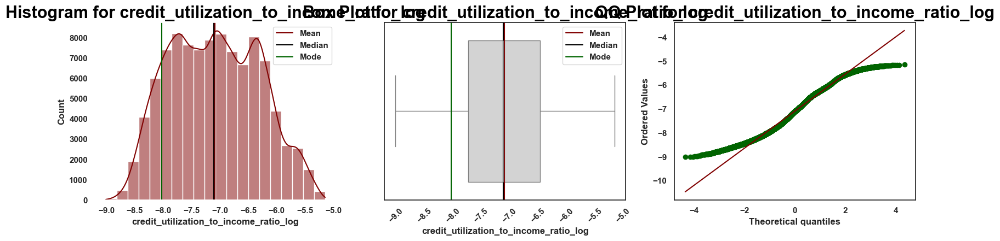



Skew for credit_utilization_to_income_ratio_log is 0.12

Kurtosis for credit_utilization_to_income_ratio_log is -0.85




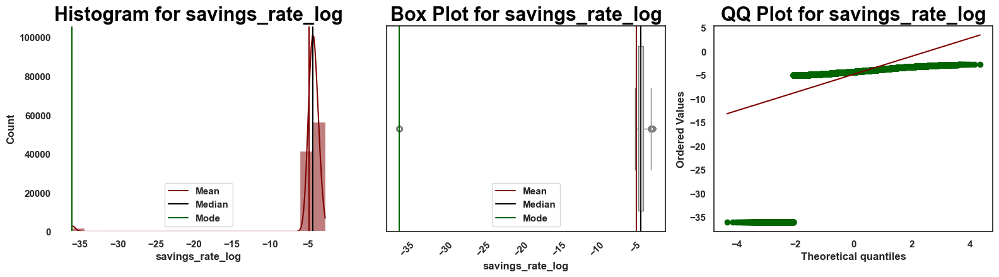



Skew for savings_rate_log is -6.89

Kurtosis for savings_rate_log is 46.04




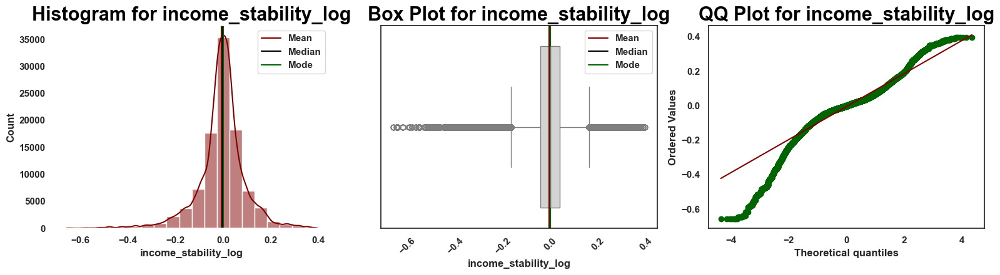



Skew for income_stability_log is -0.72

Kurtosis for income_stability_log is 4.29




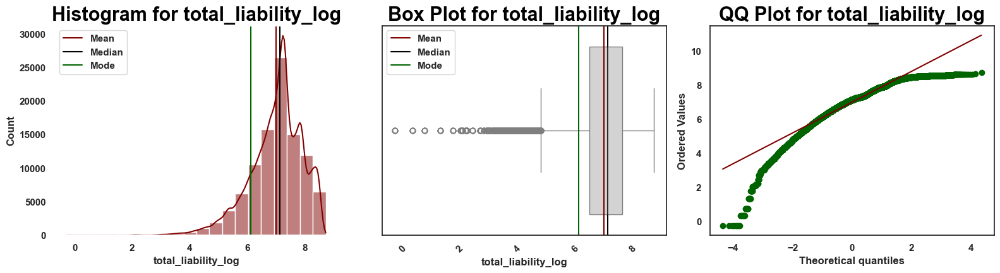



Skew for total_liability_log is -0.96

Kurtosis for total_liability_log is 1.96




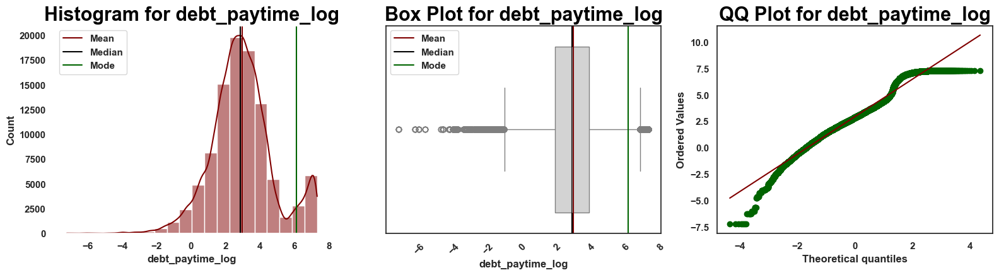



Skew for debt_paytime_log is 0.18

Kurtosis for debt_paytime_log is 0.84




/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:731: RuntimeWarning: invalid value encountered in scalar divide
  the_mean = the_sum / count if count > 0 else np.nan


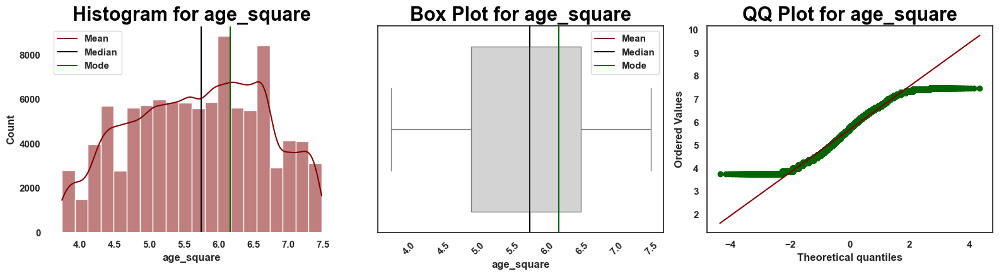

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)




Skew for age_square is nan

Kurtosis for age_square is nan




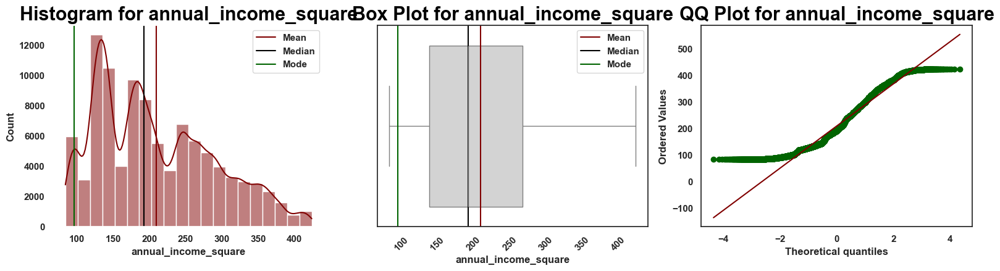



Skew for annual_income_square is 0.54

Kurtosis for annual_income_square is -0.61




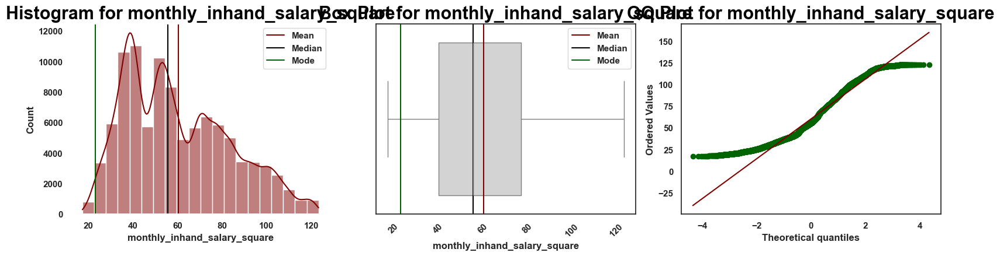



Skew for monthly_inhand_salary_square is 0.53

Kurtosis for monthly_inhand_salary_square is -0.60




/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:731: RuntimeWarning: invalid value encountered in scalar divide
  the_mean = the_sum / count if count > 0 else np.nan


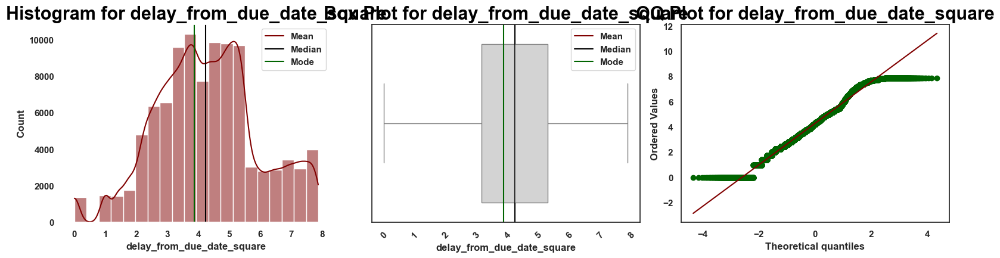

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:731: RuntimeWarning: invalid value encountered in scalar divide
  the_mean = the_sum / count if count > 0 else np.nan




Skew for delay_from_due_date_square is nan

Kurtosis for delay_from_due_date_square is nan




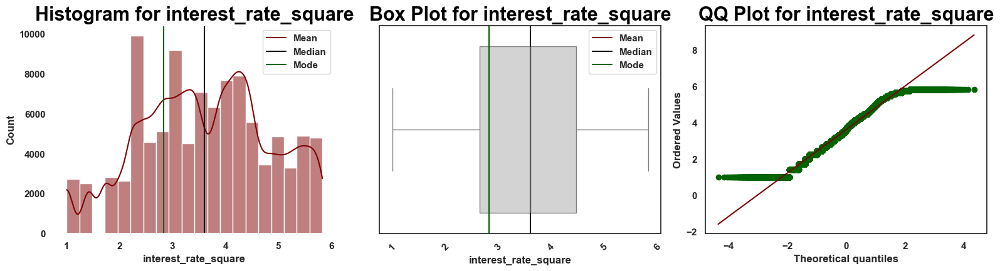

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)




Skew for interest_rate_square is nan

Kurtosis for interest_rate_square is nan




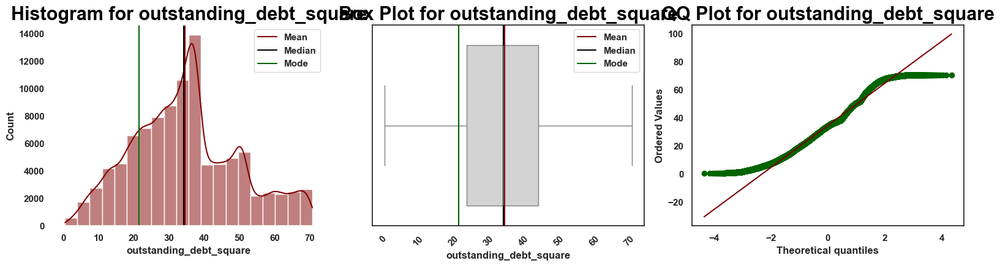



Skew for outstanding_debt_square is 0.31

Kurtosis for outstanding_debt_square is -0.34




/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:731: RuntimeWarning: invalid value encountered in scalar divide
  the_mean = the_sum / count if count > 0 else np.nan


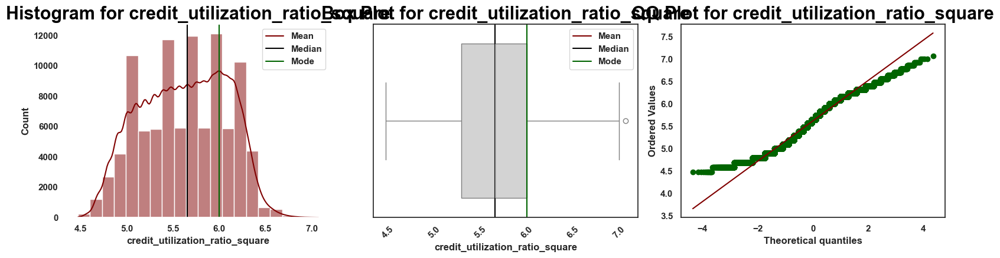

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)




Skew for credit_utilization_ratio_square is nan

Kurtosis for credit_utilization_ratio_square is nan




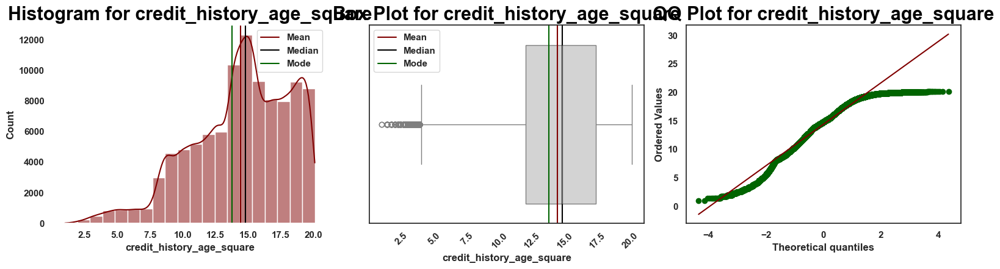



Skew for credit_history_age_square is -0.63

Kurtosis for credit_history_age_square is -0.03




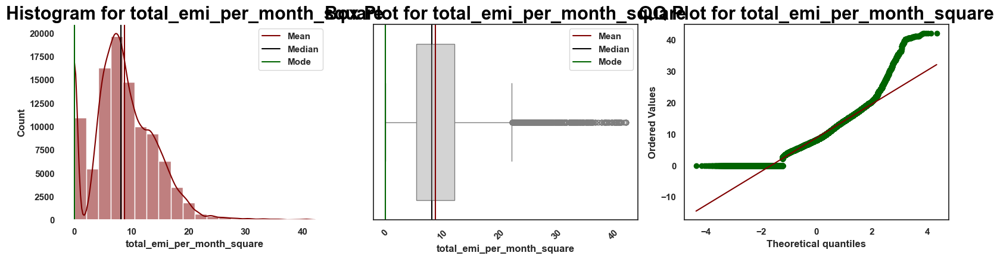



Skew for total_emi_per_month_square is 0.77

Kurtosis for total_emi_per_month_square is 1.95




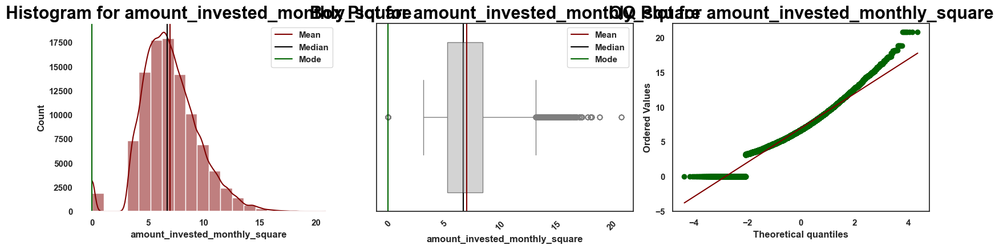



Skew for amount_invested_monthly_square is 0.38

Kurtosis for amount_invested_monthly_square is 1.05




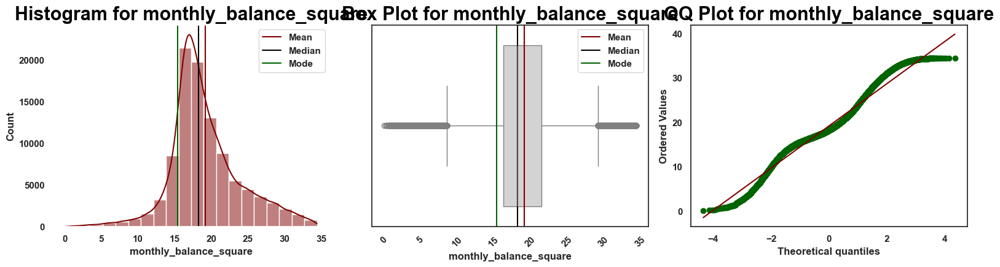



Skew for monthly_balance_square is 0.48

Kurtosis for monthly_balance_square is 1.01




/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:731: RuntimeWarning: invalid value encountered in scalar divide
  the_mean = the_sum / count if count > 0 else np.nan


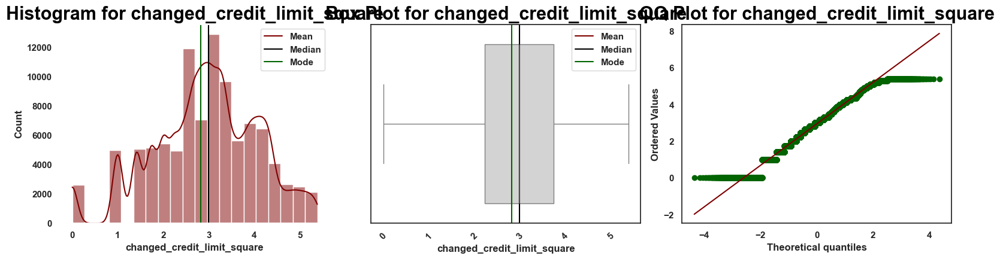

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)




Skew for changed_credit_limit_square is nan

Kurtosis for changed_credit_limit_square is nan




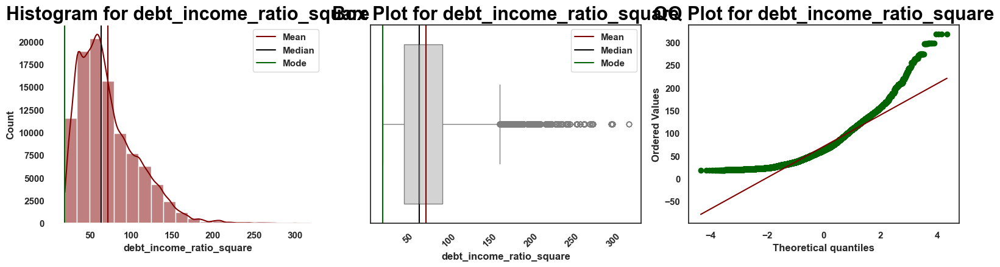



Skew for debt_income_ratio_square is 1.16

Kurtosis for debt_income_ratio_square is 1.82




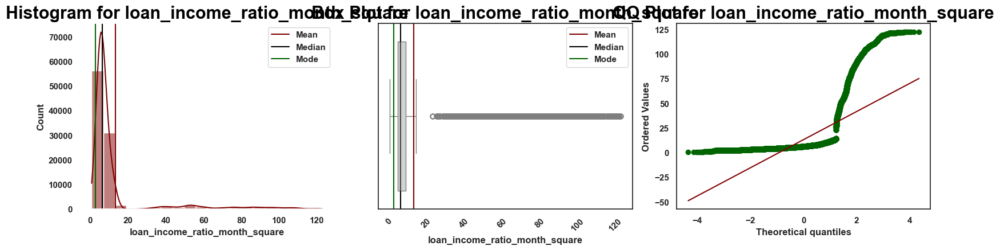



Skew for loan_income_ratio_month_square is 3.11

Kurtosis for loan_income_ratio_month_square is 9.05




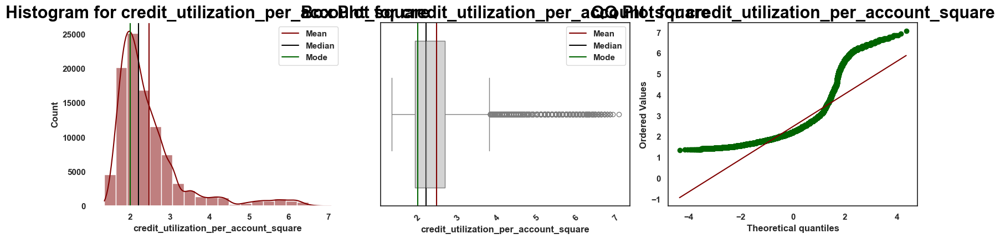



Skew for credit_utilization_per_account_square is 2.26

Kurtosis for credit_utilization_per_account_square is 5.61




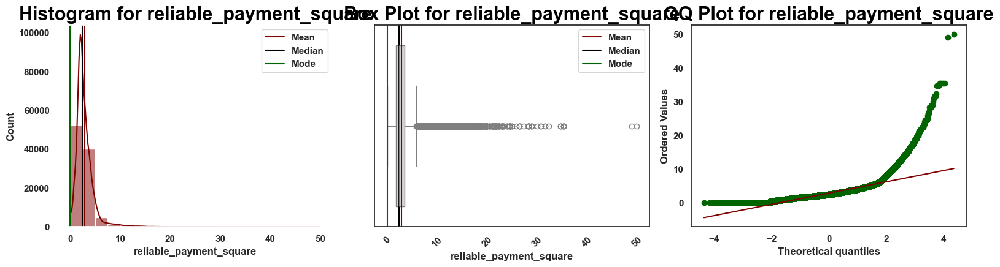



Skew for reliable_payment_square is 4.00

Kurtosis for reliable_payment_square is 34.66




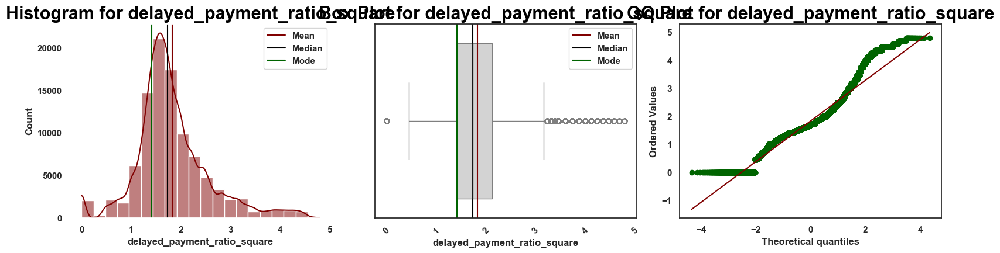



Skew for delayed_payment_ratio_square is 0.88

Kurtosis for delayed_payment_ratio_square is 1.98




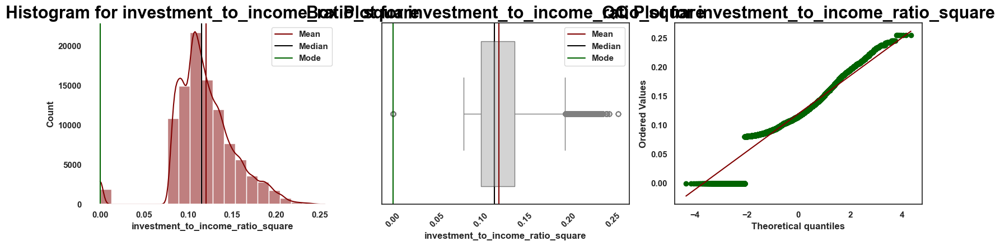



Skew for investment_to_income_ratio_square is -0.08

Kurtosis for investment_to_income_ratio_square is 2.33




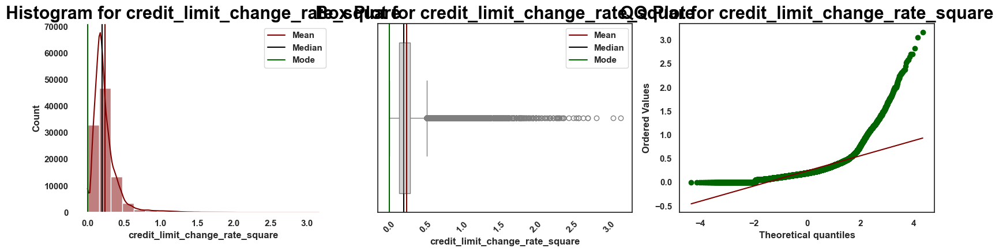



Skew for credit_limit_change_rate_square is 3.42

Kurtosis for credit_limit_change_rate_square is 20.45




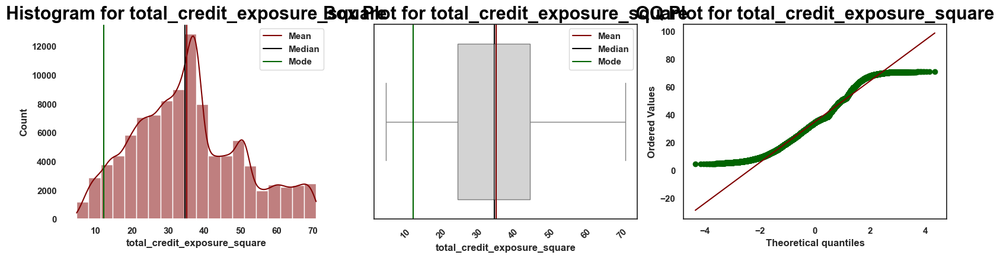



Skew for total_credit_exposure_square is 0.37

Kurtosis for total_credit_exposure_square is -0.35




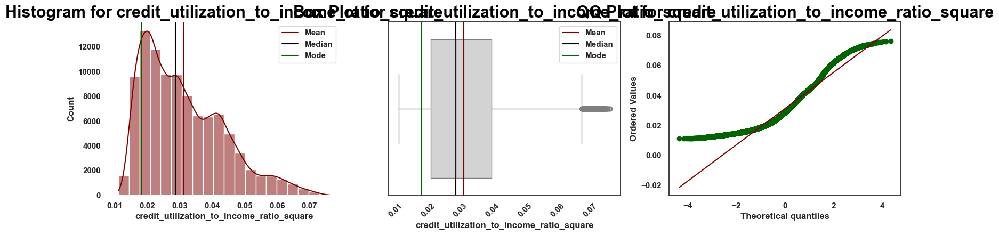



Skew for credit_utilization_to_income_ratio_square is 0.82

Kurtosis for credit_utilization_to_income_ratio_square is 0.12




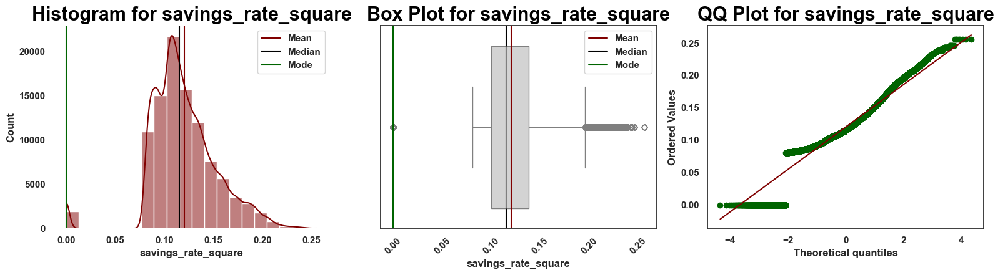



Skew for savings_rate_square is -0.07

Kurtosis for savings_rate_square is 2.33




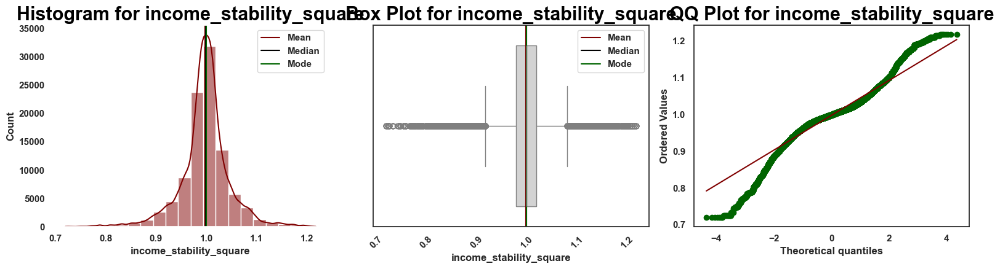



Skew for income_stability_square is -0.31

Kurtosis for income_stability_square is 3.50




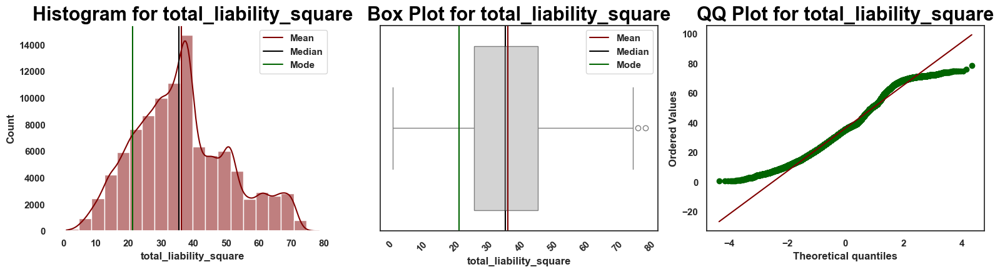



Skew for total_liability_square is 0.38

Kurtosis for total_liability_square is -0.31




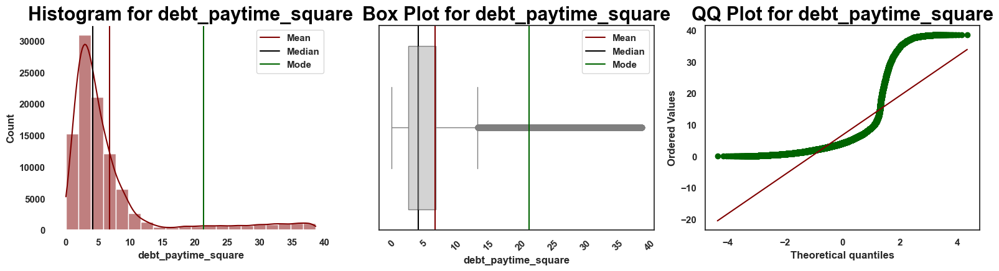



Skew for debt_paytime_square is 2.56

Kurtosis for debt_paytime_square is 5.99




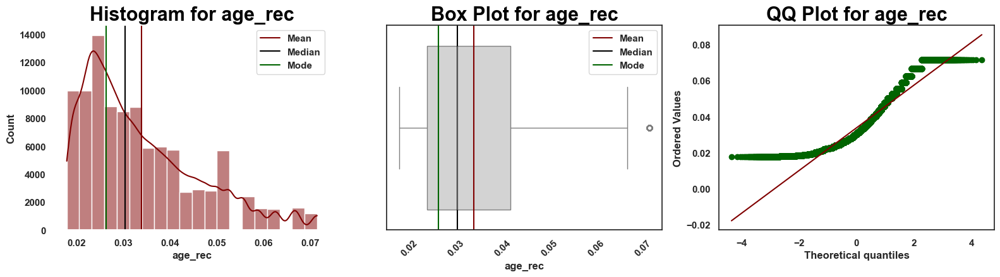



Skew for age_rec is 0.99

Kurtosis for age_rec is 0.34




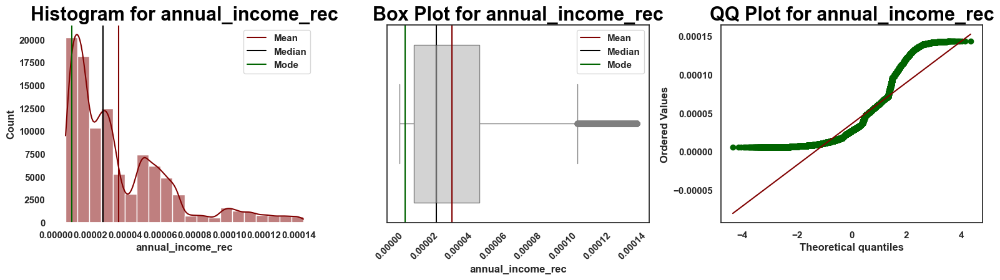



Skew for annual_income_rec is 1.46

Kurtosis for annual_income_rec is 1.84




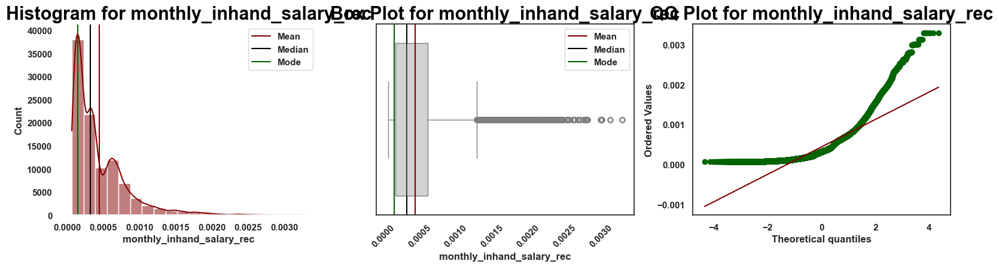



Skew for monthly_inhand_salary_rec is 2.04

Kurtosis for monthly_inhand_salary_rec is 5.74




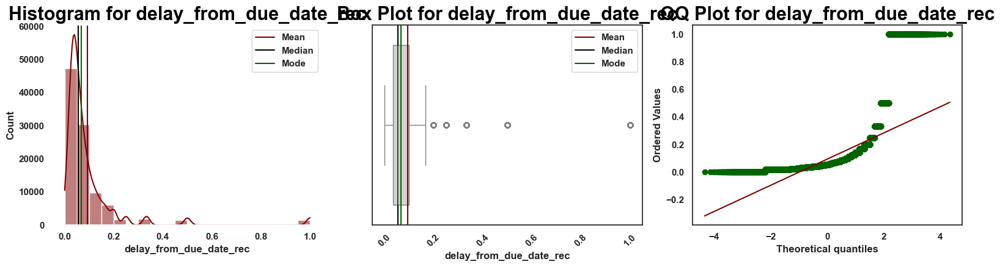



Skew for delay_from_due_date_rec is 4.79

Kurtosis for delay_from_due_date_rec is 27.02




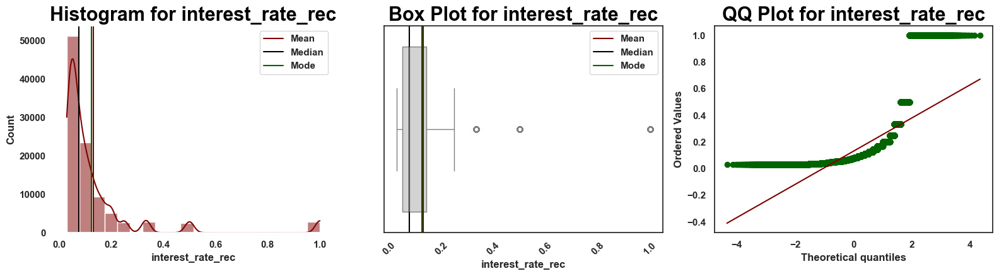



Skew for interest_rate_rec is 3.77

Kurtosis for interest_rate_rec is 15.41




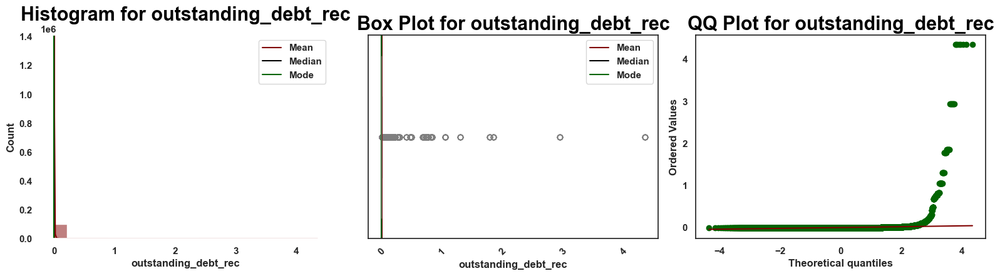



Skew for outstanding_debt_rec is 48.89

Kurtosis for outstanding_debt_rec is 2979.07




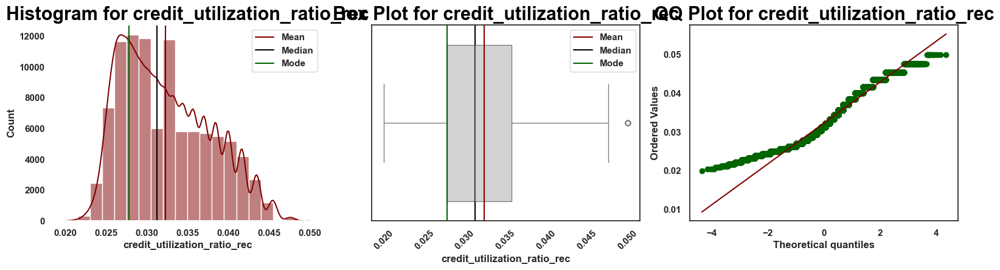



Skew for credit_utilization_ratio_rec is 0.49

Kurtosis for credit_utilization_ratio_rec is -0.66




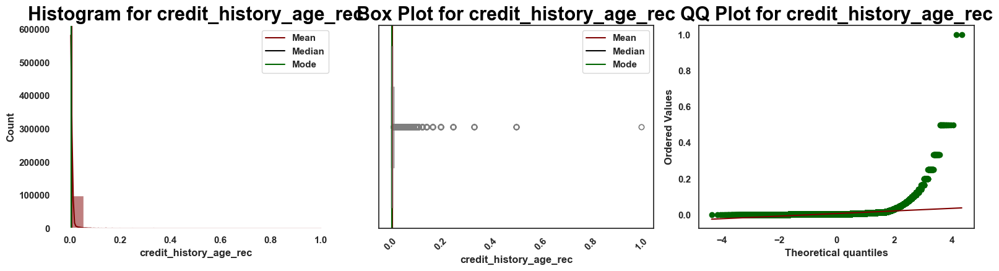



Skew for credit_history_age_rec is 18.39

Kurtosis for credit_history_age_rec is 664.17




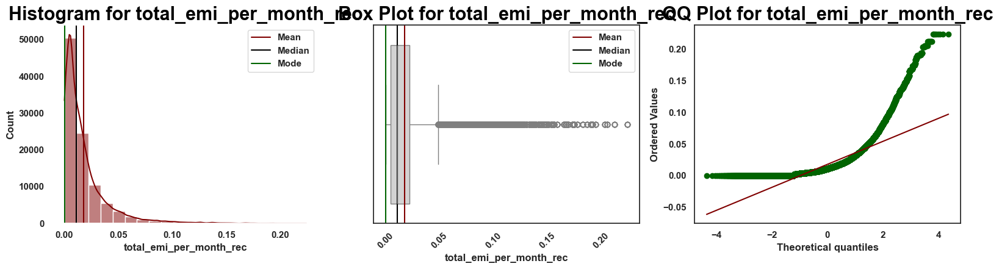



Skew for total_emi_per_month_rec is 2.93

Kurtosis for total_emi_per_month_rec is 12.55




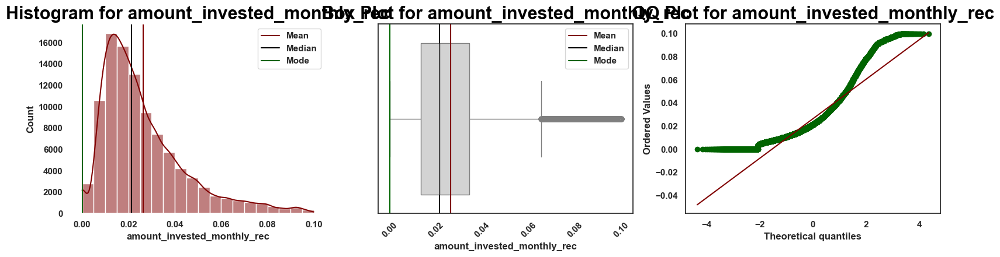



Skew for amount_invested_monthly_rec is 1.40

Kurtosis for amount_invested_monthly_rec is 1.98




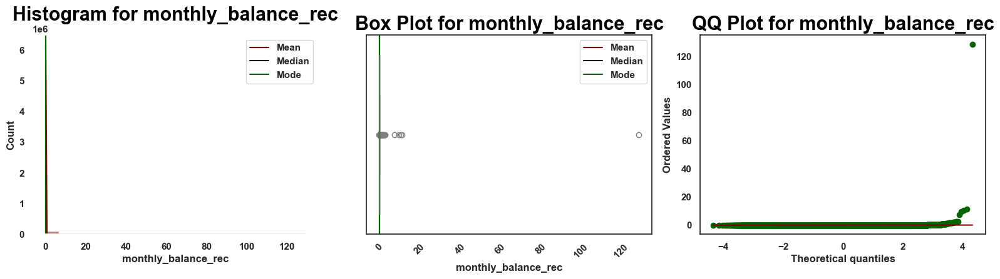



Skew for monthly_balance_rec is 303.79

Kurtosis for monthly_balance_rec is 94563.20




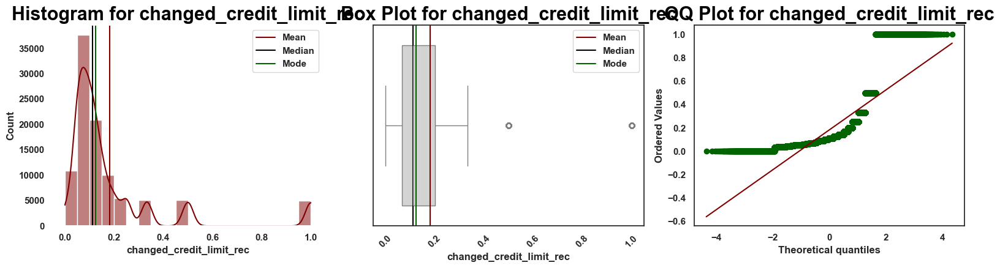



Skew for changed_credit_limit_rec is 2.72

Kurtosis for changed_credit_limit_rec is 7.21




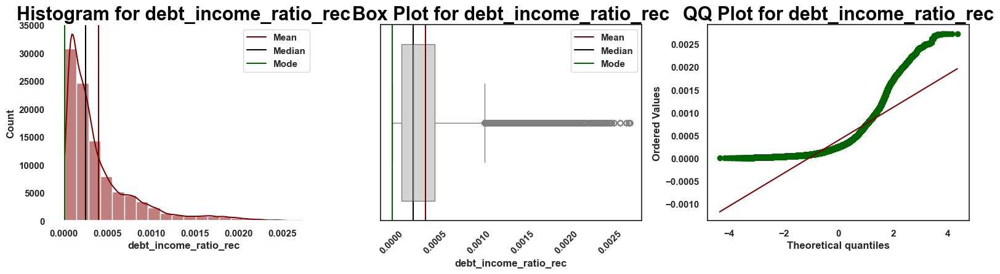



Skew for debt_income_ratio_rec is 2.10

Kurtosis for debt_income_ratio_rec is 4.86




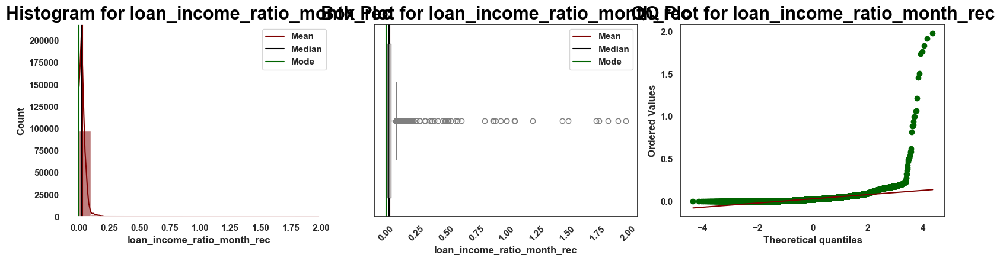



Skew for loan_income_ratio_month_rec is 15.94

Kurtosis for loan_income_ratio_month_rec is 744.84




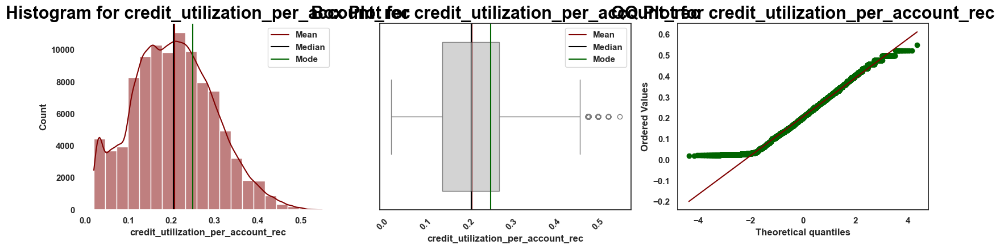



Skew for credit_utilization_per_account_rec is 0.22

Kurtosis for credit_utilization_per_account_rec is -0.30




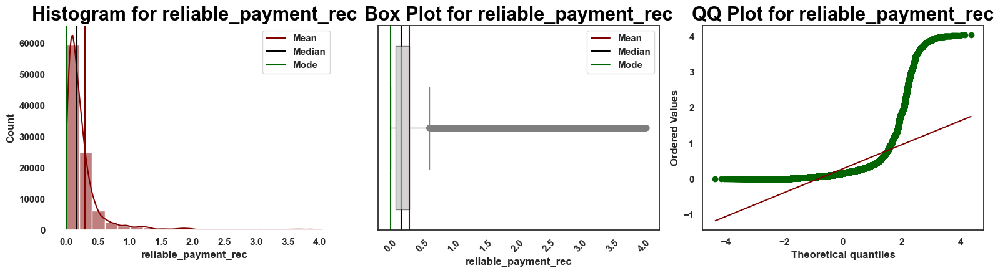



Skew for reliable_payment_rec is 4.62

Kurtosis for reliable_payment_rec is 25.14




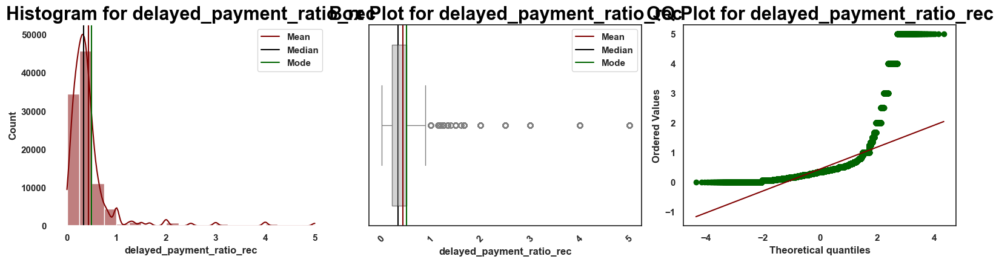



Skew for delayed_payment_ratio_rec is 5.18

Kurtosis for delayed_payment_ratio_rec is 34.61




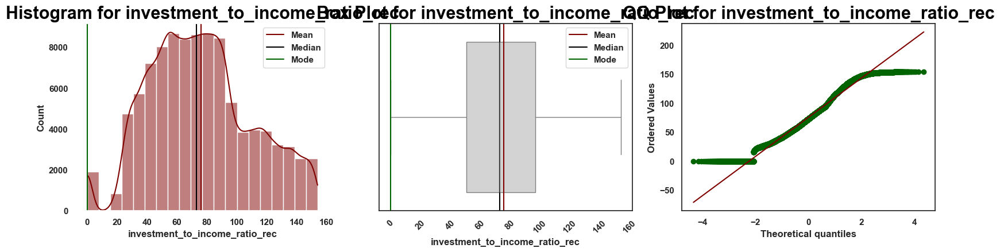



Skew for investment_to_income_ratio_rec is 0.28

Kurtosis for investment_to_income_ratio_rec is -0.47




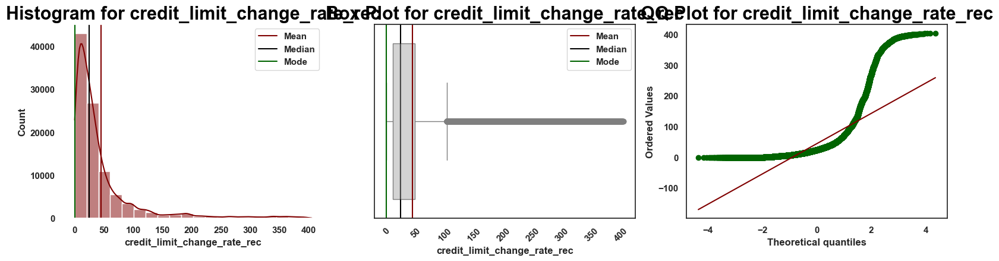



Skew for credit_limit_change_rate_rec is 3.09

Kurtosis for credit_limit_change_rate_rec is 10.74




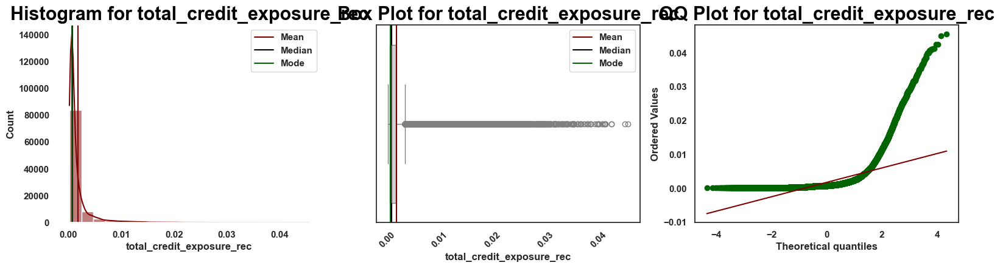



Skew for total_credit_exposure_rec is 5.04

Kurtosis for total_credit_exposure_rec is 33.64




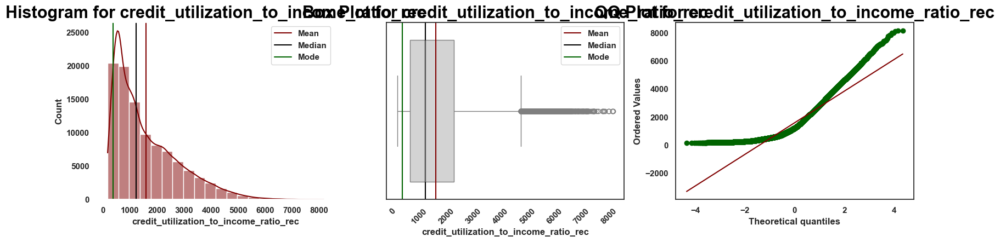



Skew for credit_utilization_to_income_ratio_rec is 1.18

Kurtosis for credit_utilization_to_income_ratio_rec is 1.05




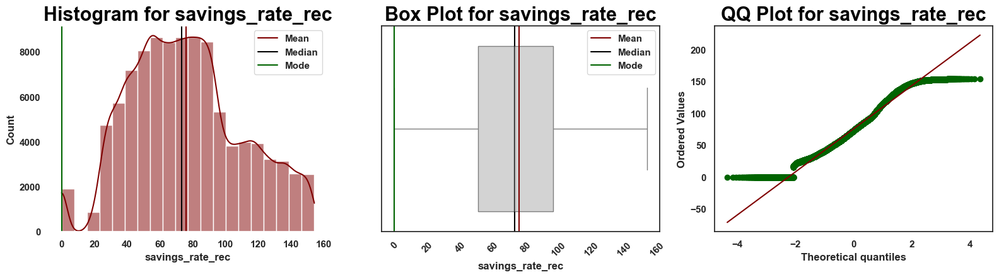



Skew for savings_rate_rec is 0.28

Kurtosis for savings_rate_rec is -0.47




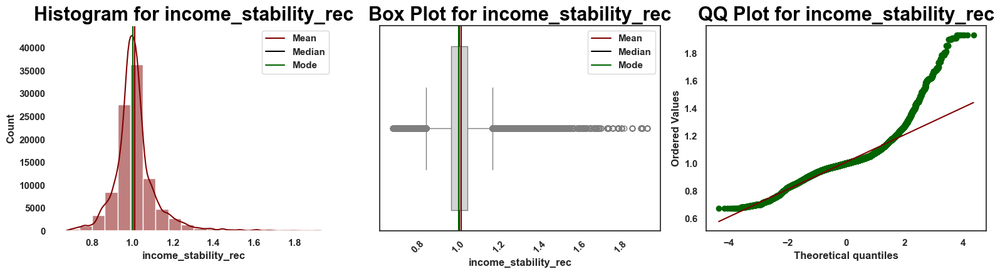



Skew for income_stability_rec is 1.66

Kurtosis for income_stability_rec is 8.17




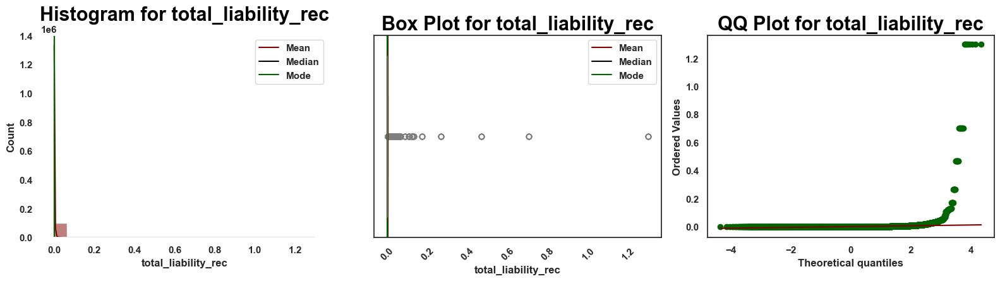



Skew for total_liability_rec is 67.80

Kurtosis for total_liability_rec is 5426.75




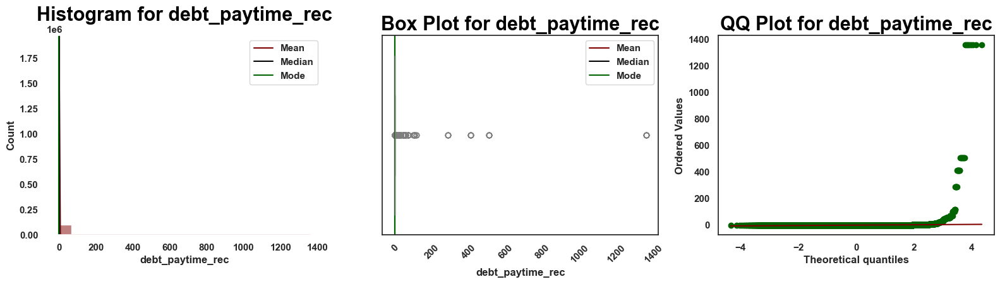



Skew for debt_paytime_rec is 82.06

Kurtosis for debt_paytime_rec is 7606.98




/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:731: RuntimeWarning: invalid value encountered in scalar divide
  the_mean = the_sum / count if count > 0 else np.nan


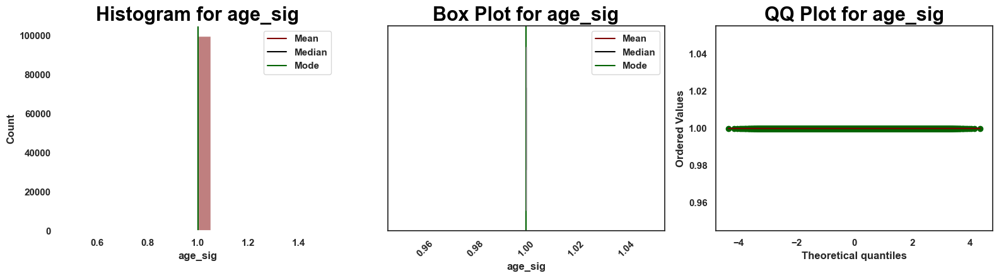

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)




Skew for age_sig is nan

Kurtosis for age_sig is nan




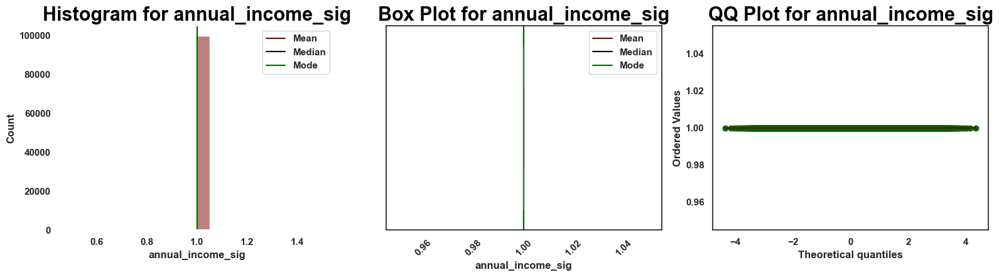



Skew for annual_income_sig is 0.00

Kurtosis for annual_income_sig is 0.00




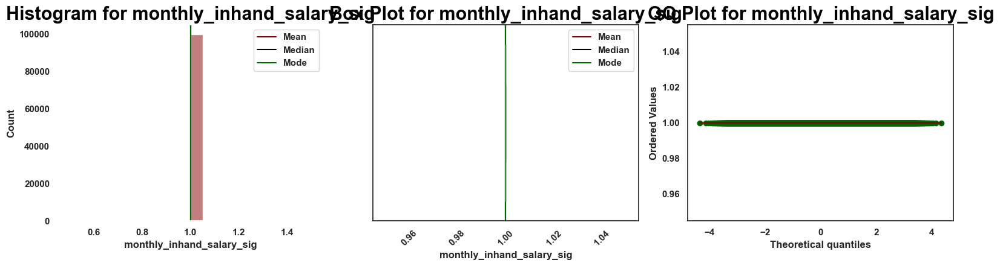



Skew for monthly_inhand_salary_sig is 0.00

Kurtosis for monthly_inhand_salary_sig is 0.00




/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:731: RuntimeWarning: invalid value encountered in scalar divide
  the_mean = the_sum / count if count > 0 else np.nan


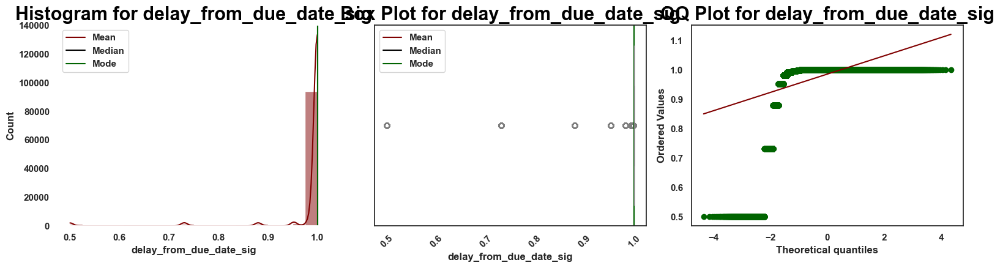

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:731: RuntimeWarning: invalid value encountered in scalar divide
  the_mean = the_sum / count if count > 0 else np.nan




Skew for delay_from_due_date_sig is nan

Kurtosis for delay_from_due_date_sig is nan




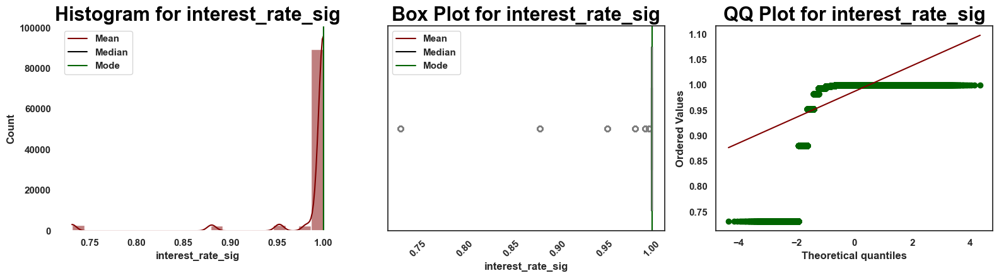

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)




Skew for interest_rate_sig is nan

Kurtosis for interest_rate_sig is nan




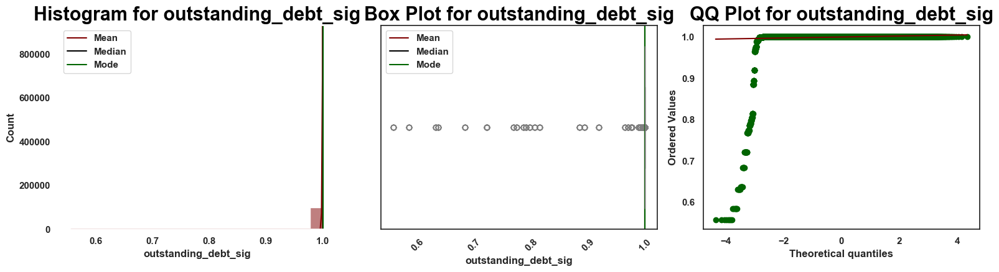



Skew for outstanding_debt_sig is -32.56

Kurtosis for outstanding_debt_sig is 1146.78




/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:731: RuntimeWarning: invalid value encountered in scalar divide
  the_mean = the_sum / count if count > 0 else np.nan


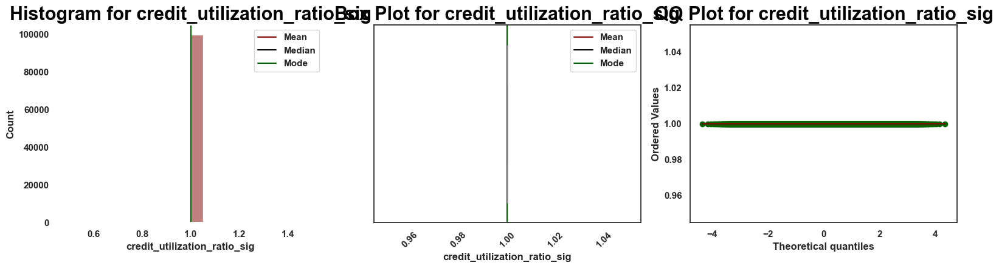

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)




Skew for credit_utilization_ratio_sig is nan

Kurtosis for credit_utilization_ratio_sig is nan




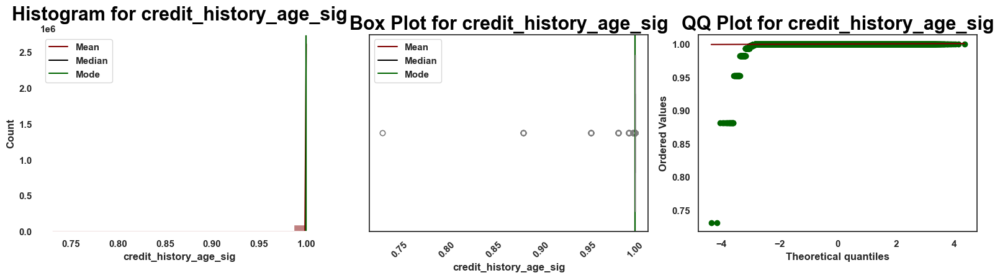



Skew for credit_history_age_sig is -77.77

Kurtosis for credit_history_age_sig is 7734.45




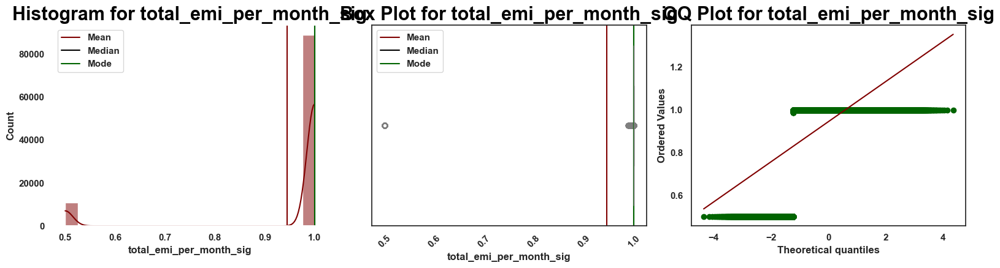



Skew for total_emi_per_month_sig is -2.50

Kurtosis for total_emi_per_month_sig is 4.23




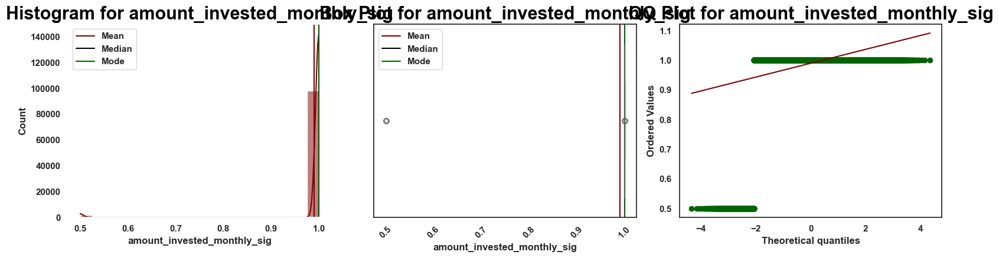



Skew for amount_invested_monthly_sig is -7.01

Kurtosis for amount_invested_monthly_sig is 47.11




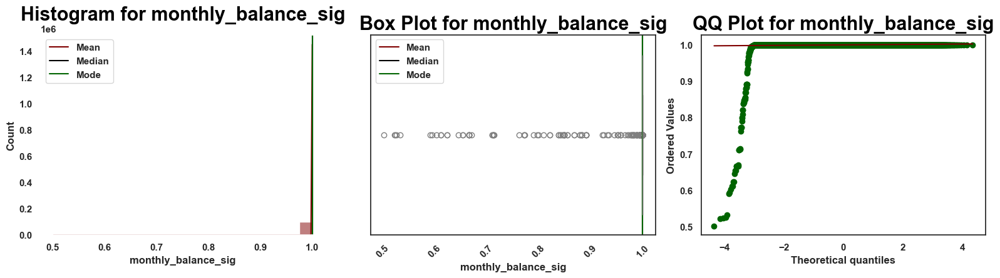



Skew for monthly_balance_sig is -50.83

Kurtosis for monthly_balance_sig is 2834.19




/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:731: RuntimeWarning: invalid value encountered in scalar divide
  the_mean = the_sum / count if count > 0 else np.nan


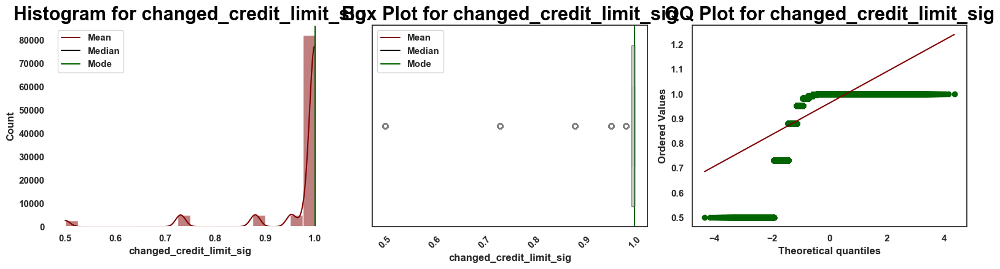

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1487: RuntimeWarning: overflow encountered in cast
  return dtype.type(n)




Skew for changed_credit_limit_sig is nan

Kurtosis for changed_credit_limit_sig is nan




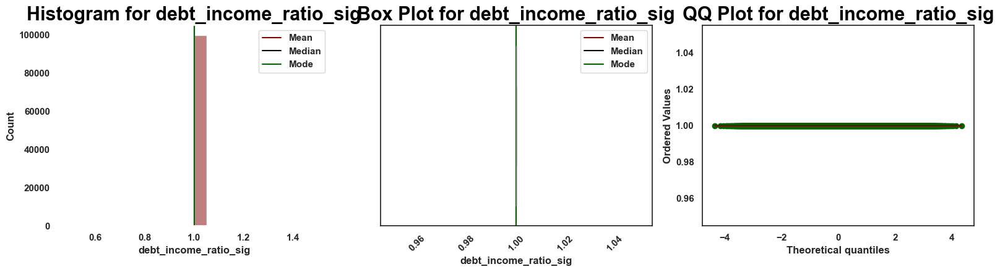



Skew for debt_income_ratio_sig is 0.00

Kurtosis for debt_income_ratio_sig is 0.00




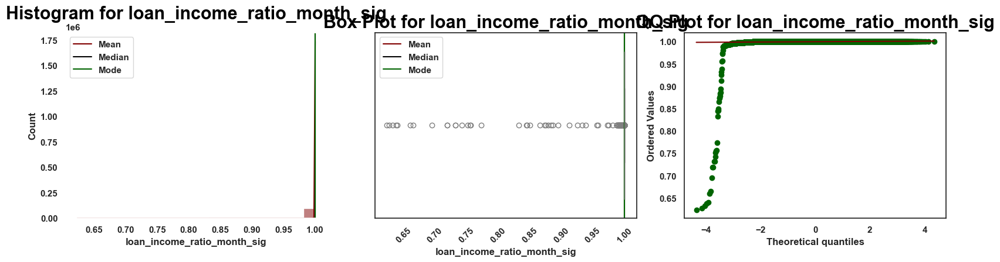



Skew for loan_income_ratio_month_sig is -68.83

Kurtosis for loan_income_ratio_month_sig is 5089.63




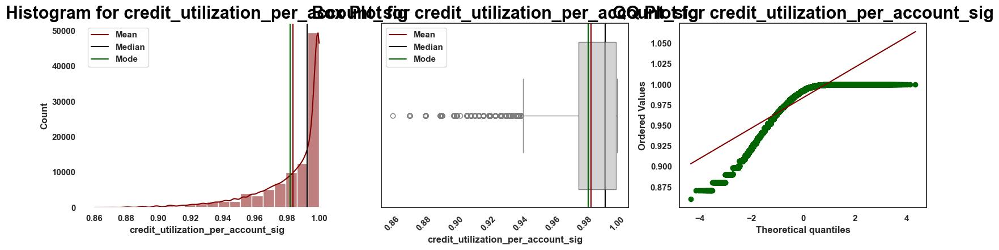



Skew for credit_utilization_per_account_sig is -1.81

Kurtosis for credit_utilization_per_account_sig is 3.34




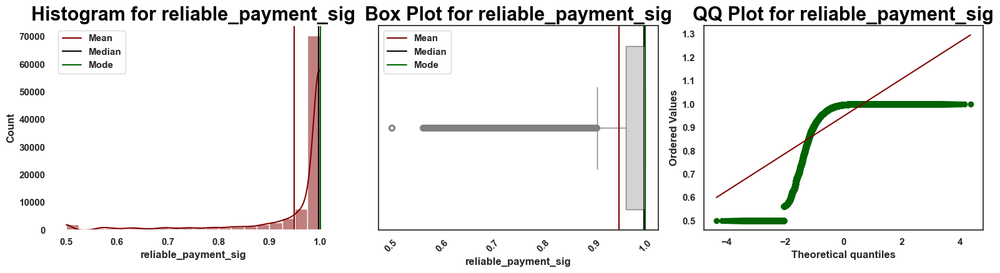



Skew for reliable_payment_sig is -2.70

Kurtosis for reliable_payment_sig is 6.67




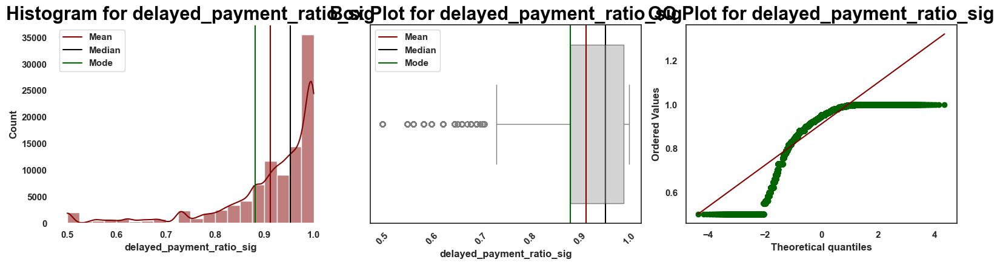



Skew for delayed_payment_ratio_sig is -2.02

Kurtosis for delayed_payment_ratio_sig is 4.10




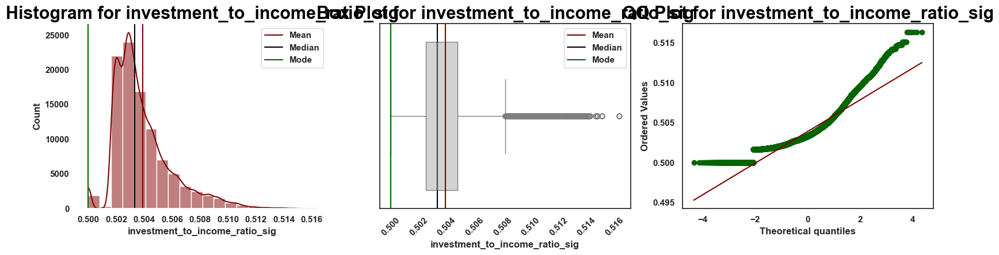



Skew for investment_to_income_ratio_sig is 1.37

Kurtosis for investment_to_income_ratio_sig is 2.41




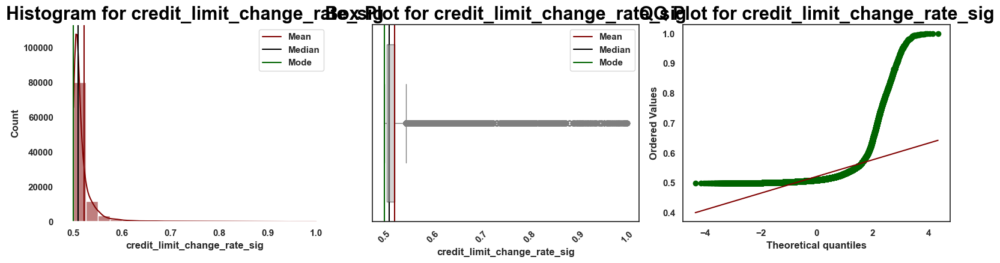



Skew for credit_limit_change_rate_sig is 5.76

Kurtosis for credit_limit_change_rate_sig is 41.28




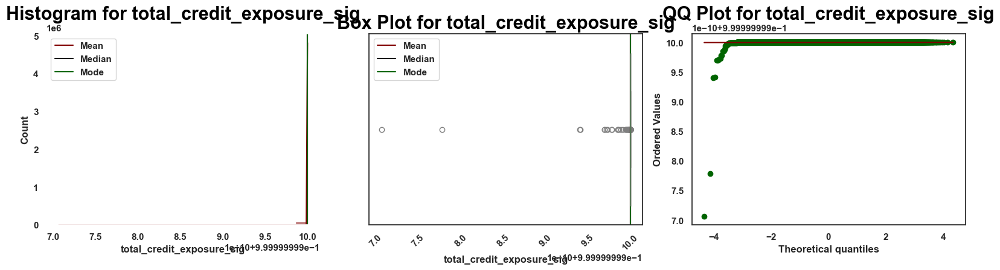



Skew for total_credit_exposure_sig is 0.00

Kurtosis for total_credit_exposure_sig is 0.00




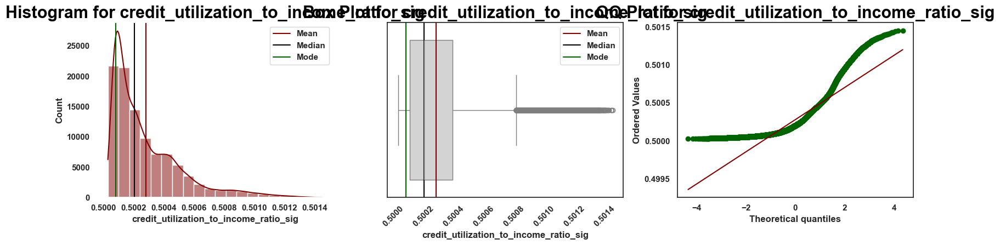



Skew for credit_utilization_to_income_ratio_sig is 1.61

Kurtosis for credit_utilization_to_income_ratio_sig is 2.71




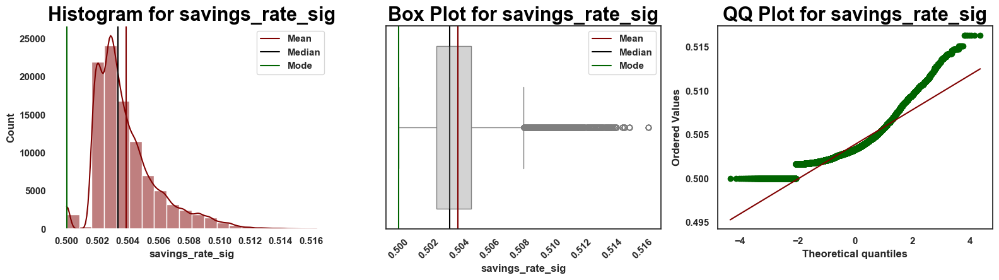



Skew for savings_rate_sig is 1.37

Kurtosis for savings_rate_sig is 2.41




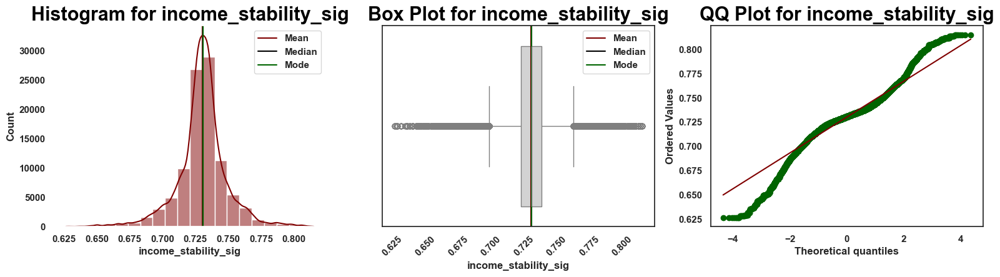



Skew for income_stability_sig is -0.26

Kurtosis for income_stability_sig is 3.26




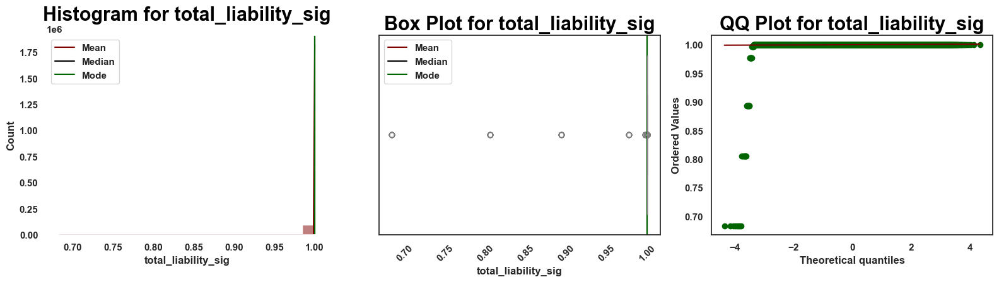



Skew for total_liability_sig is -77.60

Kurtosis for total_liability_sig is 6447.56




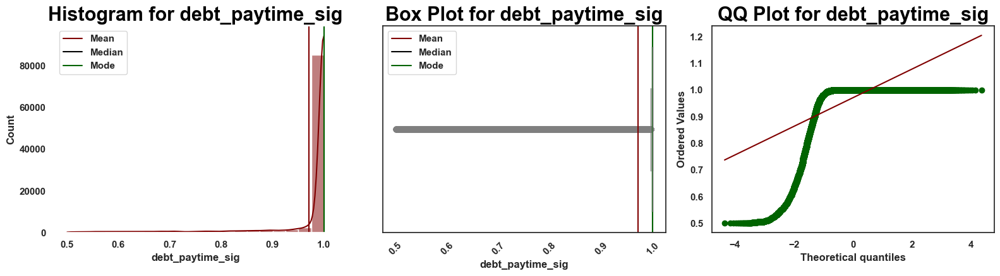



Skew for debt_paytime_sig is -3.49

Kurtosis for debt_paytime_sig is 11.93




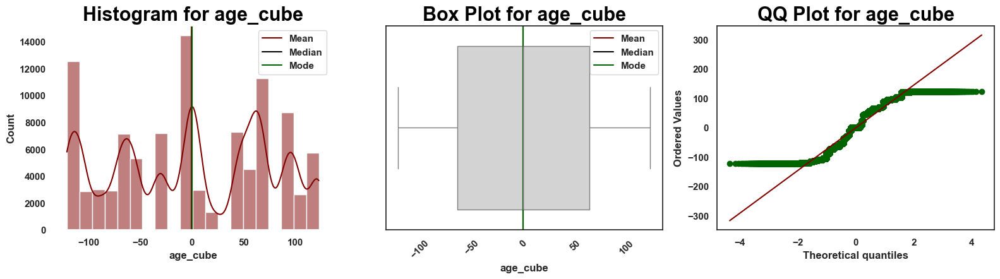



Skew for age_cube is -0.07

Kurtosis for age_cube is -1.23




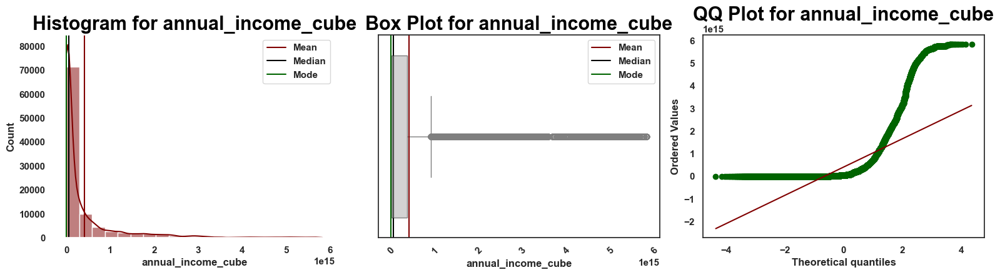



Skew for annual_income_cube is 3.33

Kurtosis for annual_income_cube is 12.69




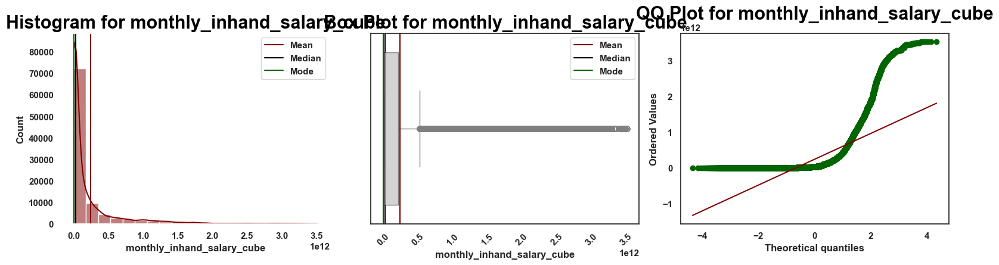



Skew for monthly_inhand_salary_cube is 3.36

Kurtosis for monthly_inhand_salary_cube is 12.94




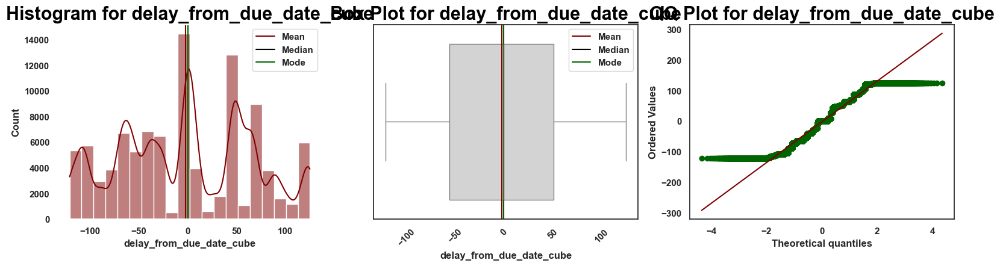



Skew for delay_from_due_date_cube is 0.06

Kurtosis for delay_from_due_date_cube is -0.95




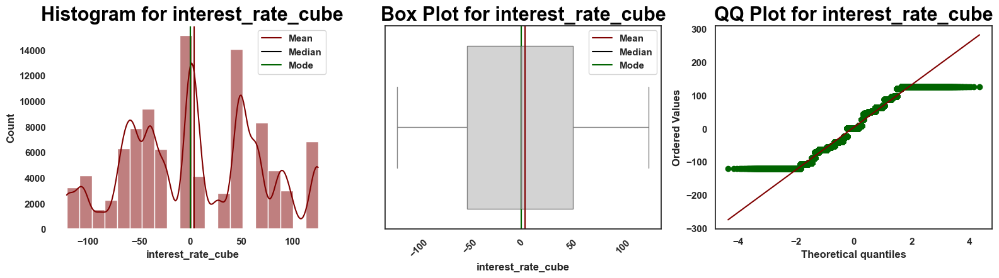



Skew for interest_rate_cube is 0.06

Kurtosis for interest_rate_cube is -0.84




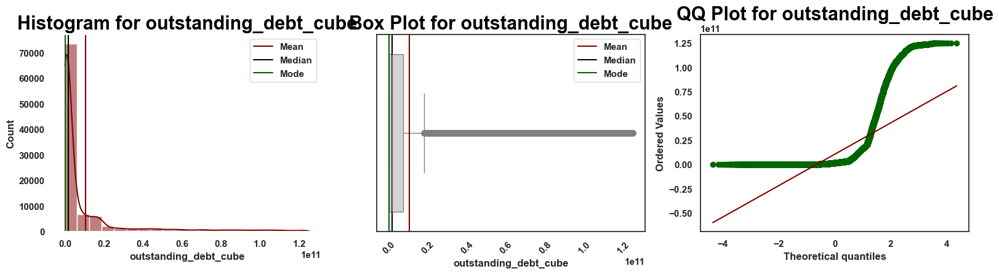



Skew for outstanding_debt_cube is 3.05

Kurtosis for outstanding_debt_cube is 9.10




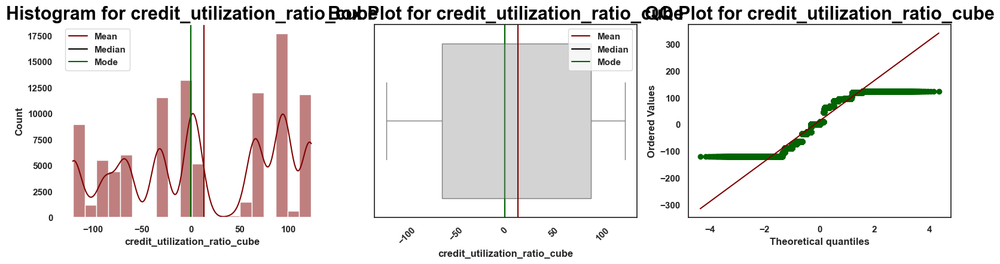



Skew for credit_utilization_ratio_cube is -0.18

Kurtosis for credit_utilization_ratio_cube is -1.28




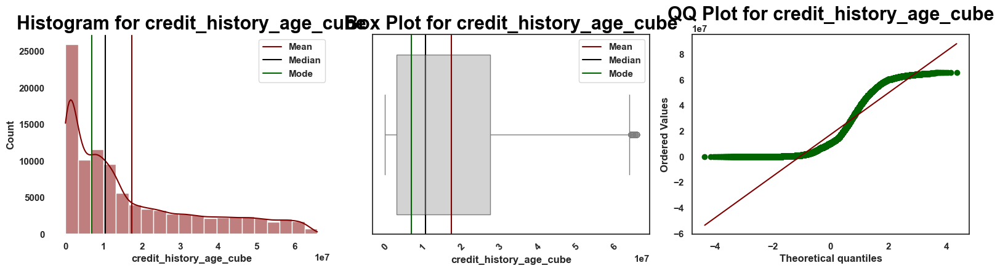



Skew for credit_history_age_cube is 1.06

Kurtosis for credit_history_age_cube is -0.05




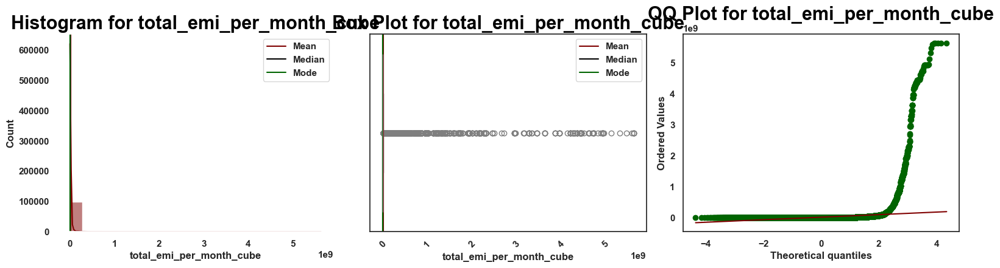



Skew for total_emi_per_month_cube is 22.04

Kurtosis for total_emi_per_month_cube is 567.24




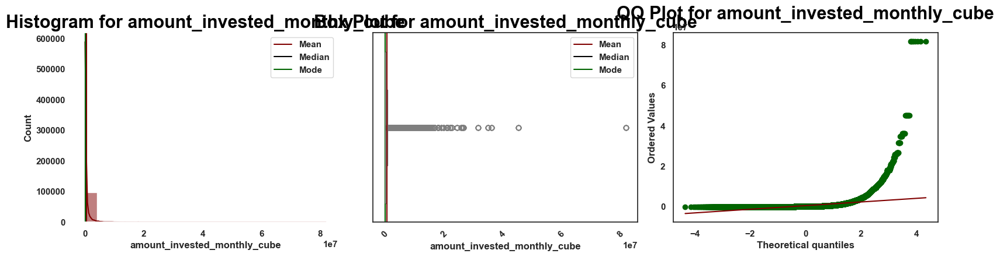



Skew for amount_invested_monthly_cube is 15.54

Kurtosis for amount_invested_monthly_cube is 485.88




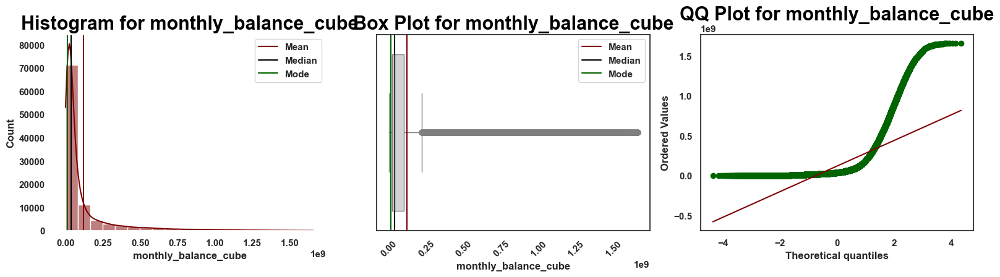



Skew for monthly_balance_cube is 3.50

Kurtosis for monthly_balance_cube is 13.95




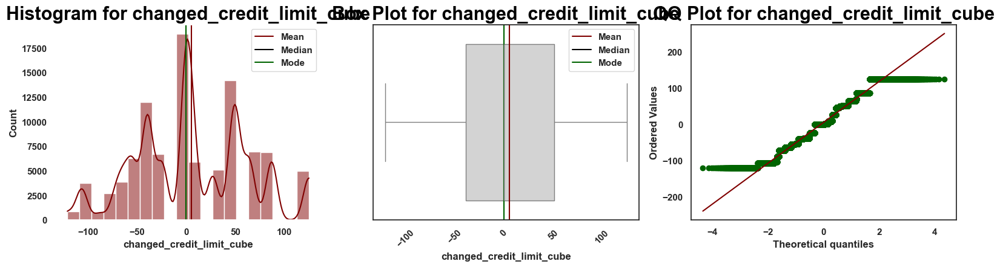



Skew for changed_credit_limit_cube is 0.10

Kurtosis for changed_credit_limit_cube is -0.52




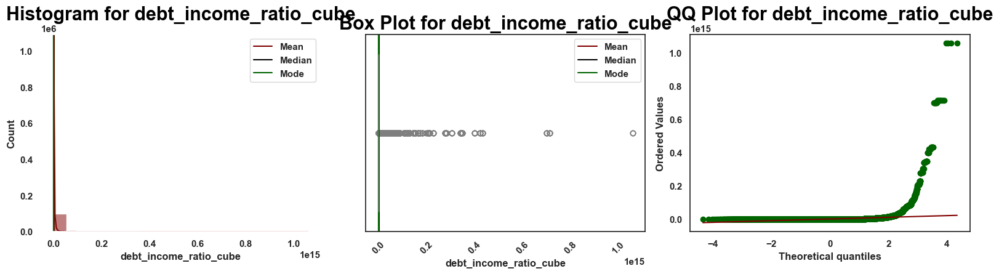



Skew for debt_income_ratio_cube is 28.66

Kurtosis for debt_income_ratio_cube is 1171.57




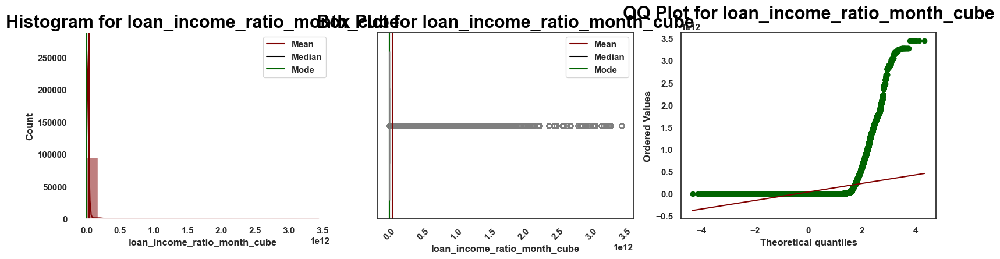



Skew for loan_income_ratio_month_cube is 8.21

Kurtosis for loan_income_ratio_month_cube is 79.92




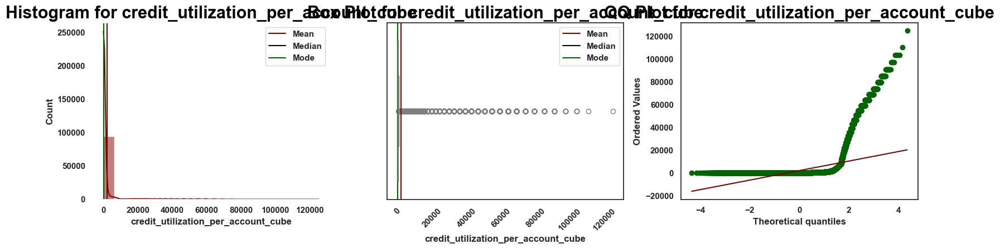



Skew for credit_utilization_per_account_cube is 5.76

Kurtosis for credit_utilization_per_account_cube is 36.41




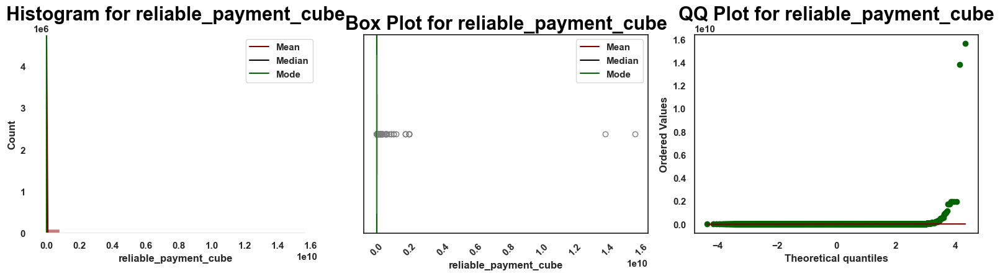



Skew for reliable_payment_cube is 202.41

Kurtosis for reliable_payment_cube is 43674.57




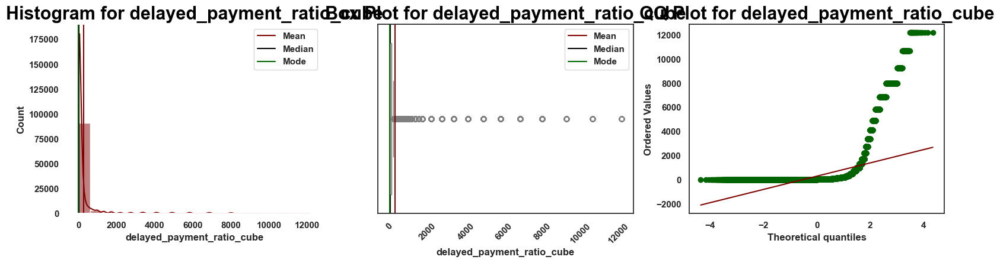



Skew for delayed_payment_ratio_cube is 5.74

Kurtosis for delayed_payment_ratio_cube is 37.45




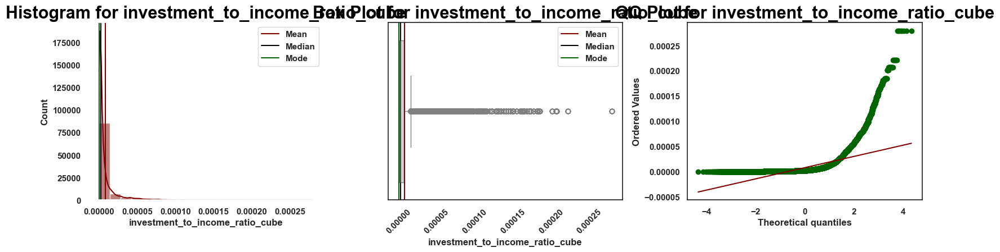



Skew for investment_to_income_ratio_cube is 5.07

Kurtosis for investment_to_income_ratio_cube is 38.60




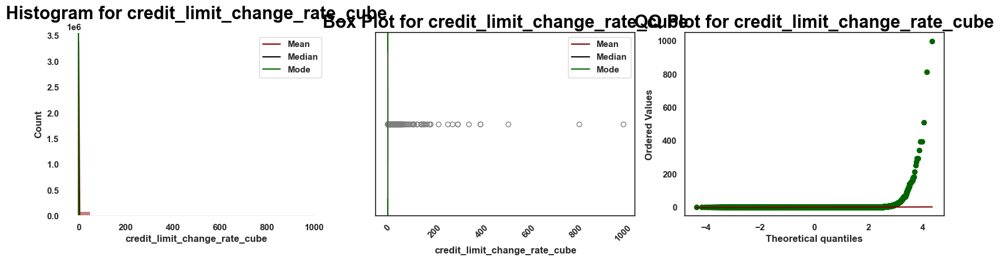



Skew for credit_limit_change_rate_cube is 103.28

Kurtosis for credit_limit_change_rate_cube is 14266.32




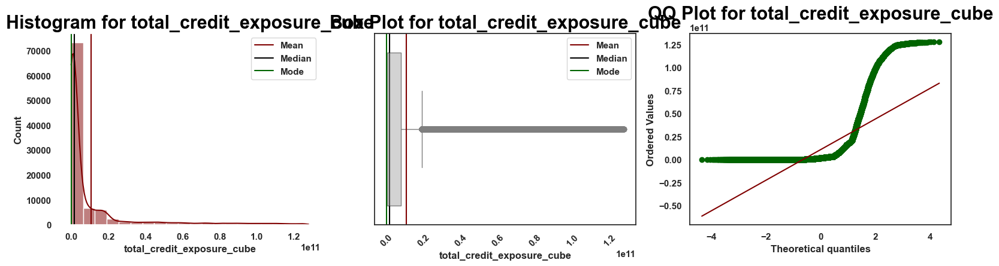



Skew for total_credit_exposure_cube is 3.04

Kurtosis for total_credit_exposure_cube is 9.01




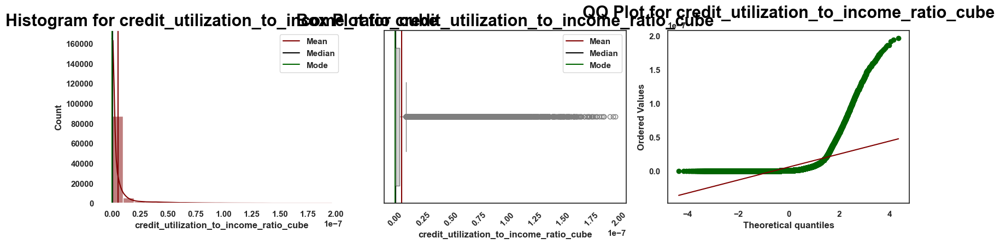



Skew for credit_utilization_to_income_ratio_cube is 0.00

Kurtosis for credit_utilization_to_income_ratio_cube is 31.63




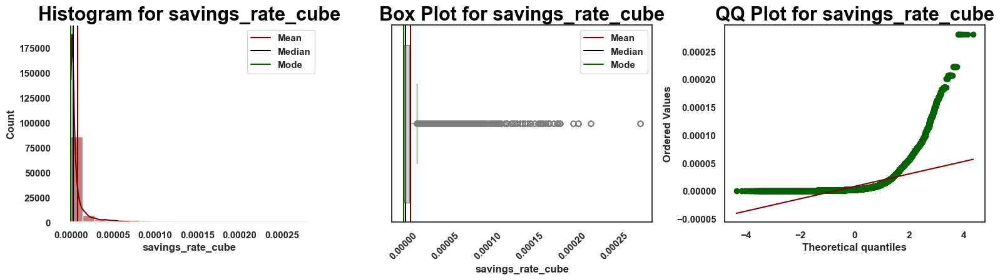



Skew for savings_rate_cube is 5.08

Kurtosis for savings_rate_cube is 38.66




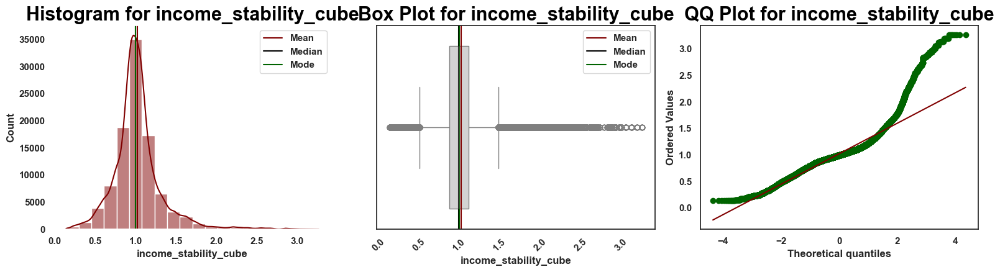



Skew for income_stability_cube is 1.62

Kurtosis for income_stability_cube is 6.98




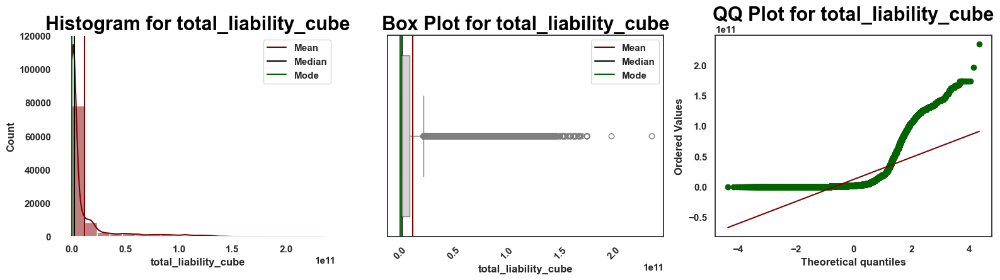



Skew for total_liability_cube is 3.04

Kurtosis for total_liability_cube is 9.19




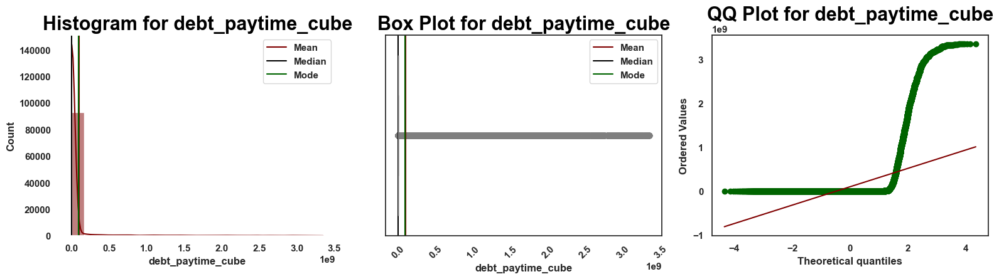



Skew for debt_paytime_cube is 5.18

Kurtosis for debt_paytime_cube is 27.93




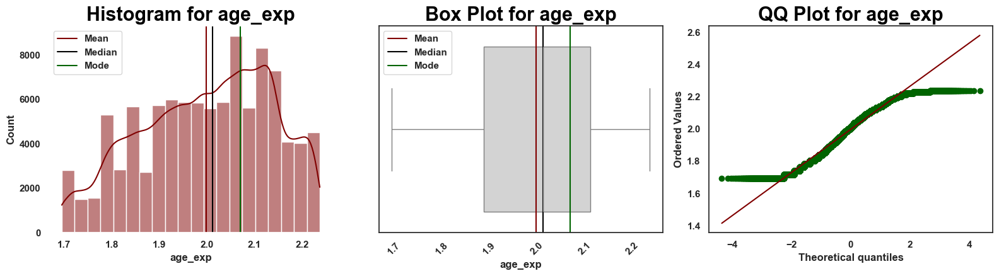



Skew for age_exp is -0.27

Kurtosis for age_exp is -0.84




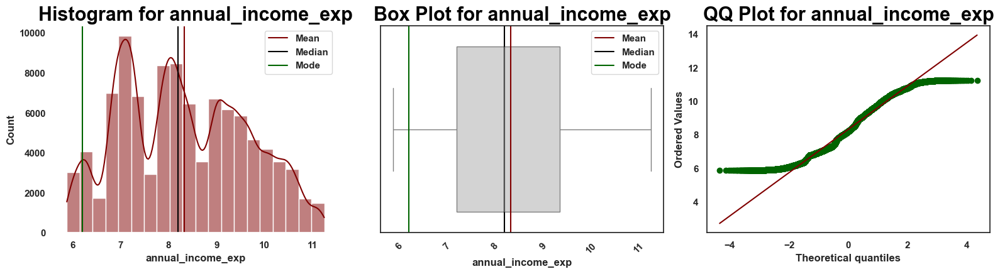



Skew for annual_income_exp is 0.18

Kurtosis for annual_income_exp is -0.91




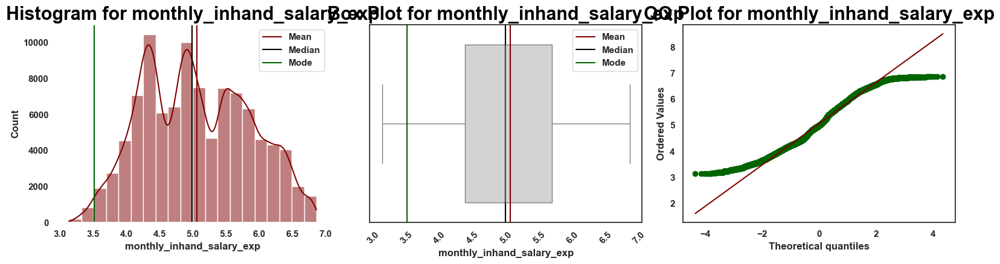



Skew for monthly_inhand_salary_exp is 0.14

Kurtosis for monthly_inhand_salary_exp is -0.86




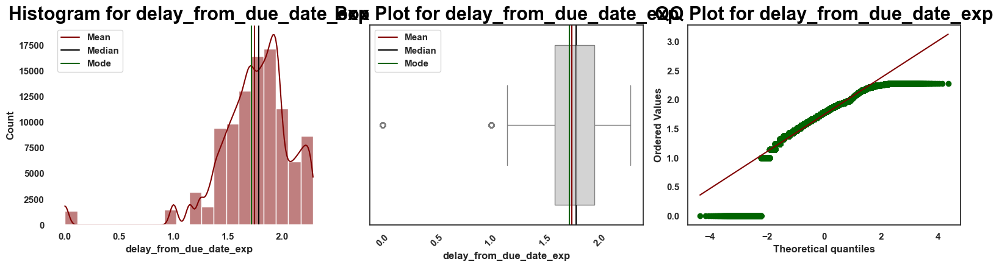



Skew for delay_from_due_date_exp is -1.88

Kurtosis for delay_from_due_date_exp is 7.57




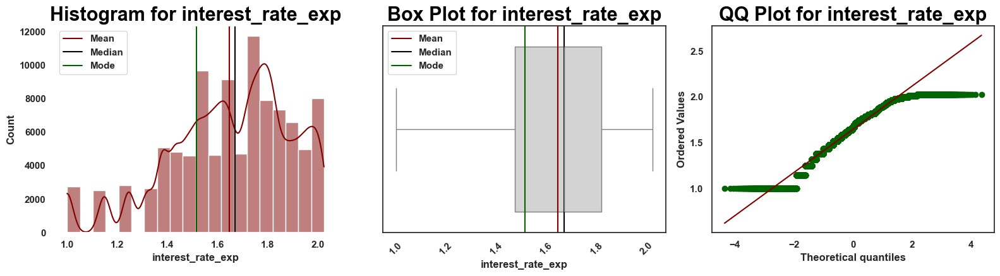



Skew for interest_rate_exp is -0.60

Kurtosis for interest_rate_exp is -0.04




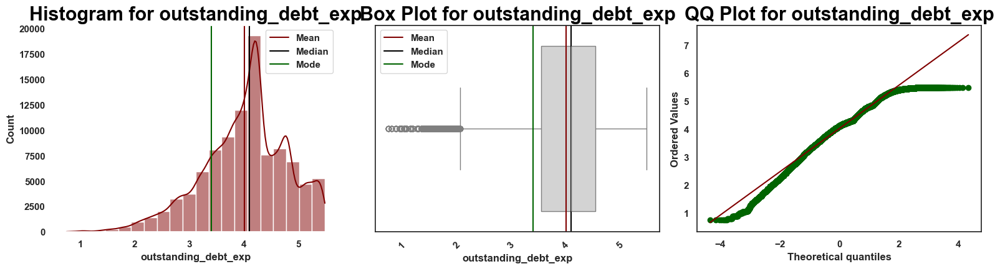



Skew for outstanding_debt_exp is -0.50

Kurtosis for outstanding_debt_exp is 0.30




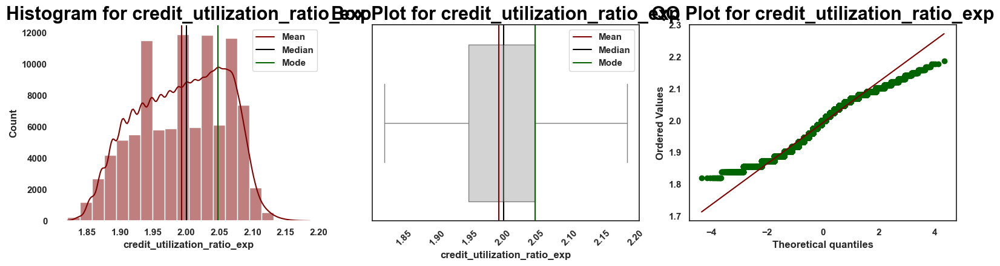



Skew for credit_utilization_ratio_exp is -0.18

Kurtosis for credit_utilization_ratio_exp is -0.92




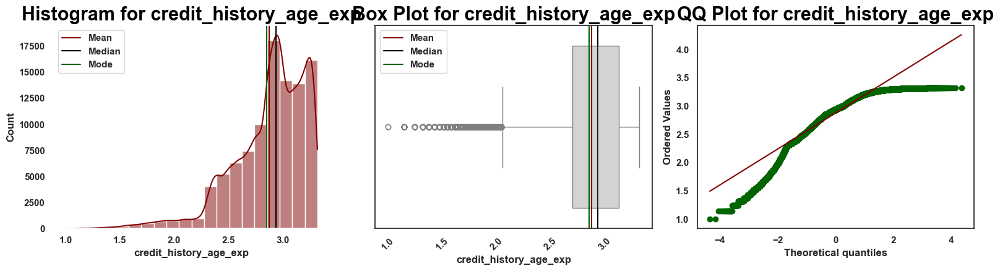



Skew for credit_history_age_exp is -1.22

Kurtosis for credit_history_age_exp is 1.93




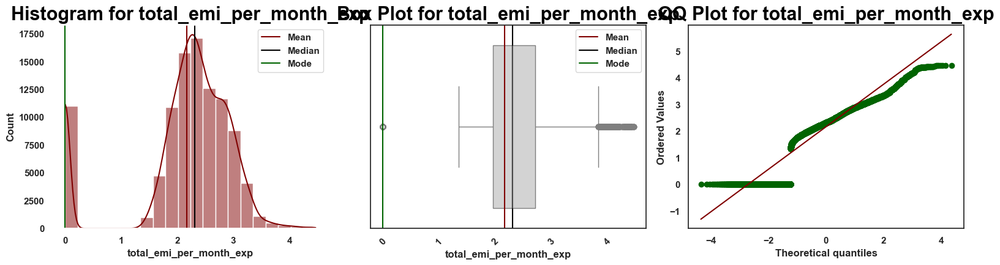



Skew for total_emi_per_month_exp is -1.35

Kurtosis for total_emi_per_month_exp is 1.52




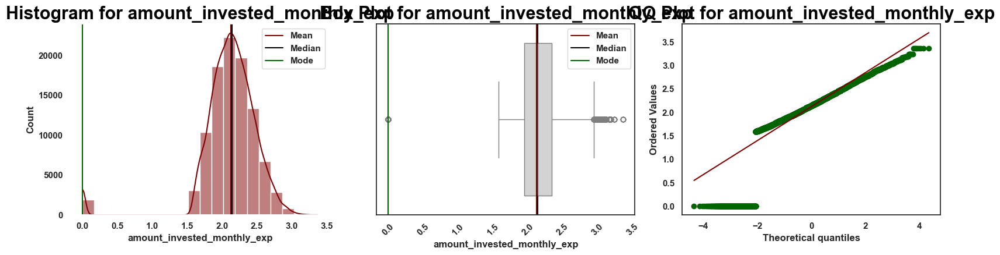



Skew for amount_invested_monthly_exp is -2.48

Kurtosis for amount_invested_monthly_exp is 11.94




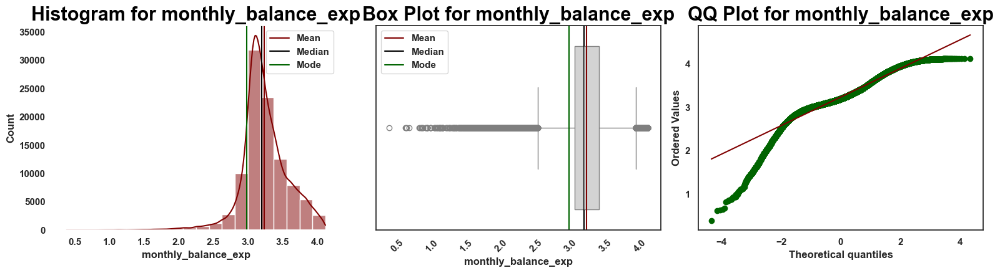



Skew for monthly_balance_exp is -0.52

Kurtosis for monthly_balance_exp is 3.55




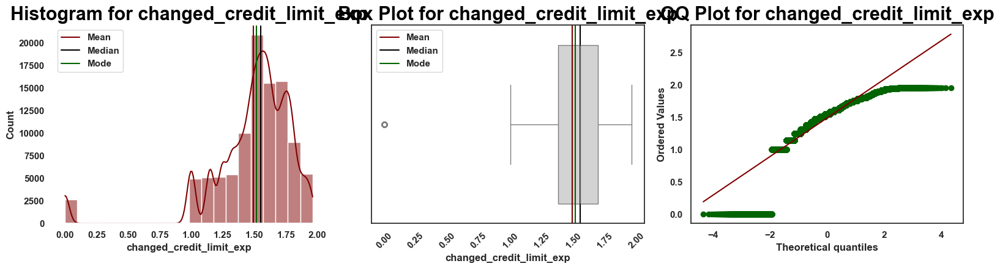



Skew for changed_credit_limit_exp is -2.32

Kurtosis for changed_credit_limit_exp is 7.98




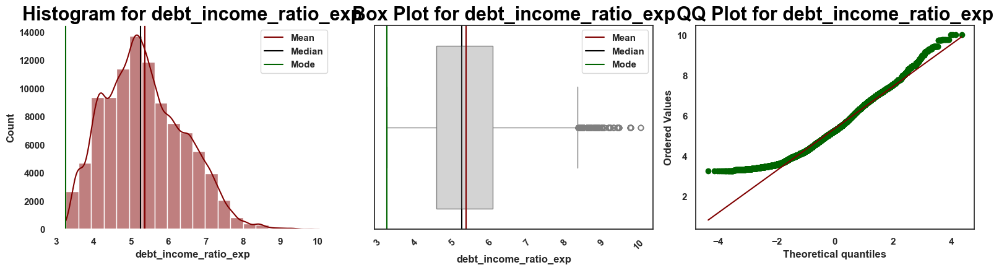



Skew for debt_income_ratio_exp is 0.42

Kurtosis for debt_income_ratio_exp is -0.22




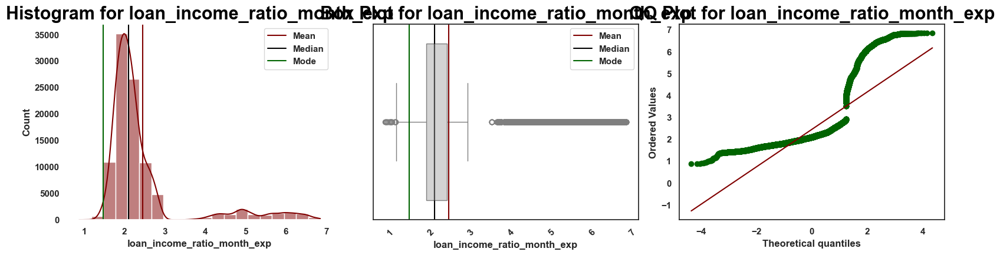



Skew for loan_income_ratio_month_exp is 2.43

Kurtosis for loan_income_ratio_month_exp is 5.04




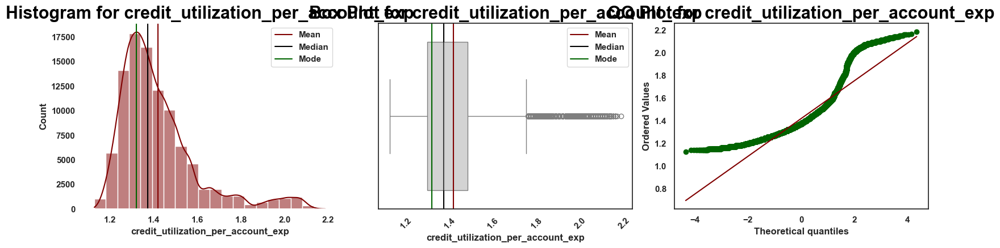



Skew for credit_utilization_per_account_exp is 1.65

Kurtosis for credit_utilization_per_account_exp is 3.01




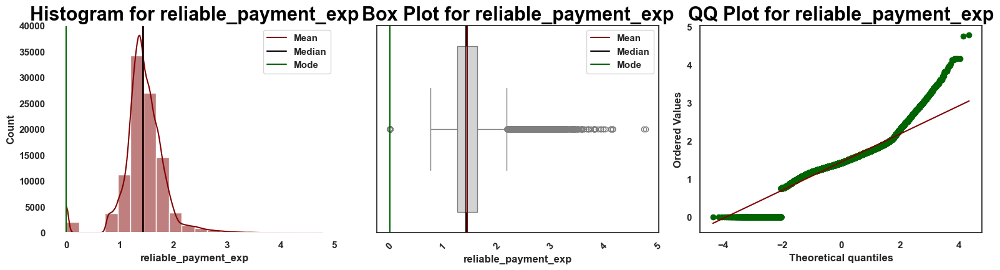



Skew for reliable_payment_exp is -0.17

Kurtosis for reliable_payment_exp is 5.06




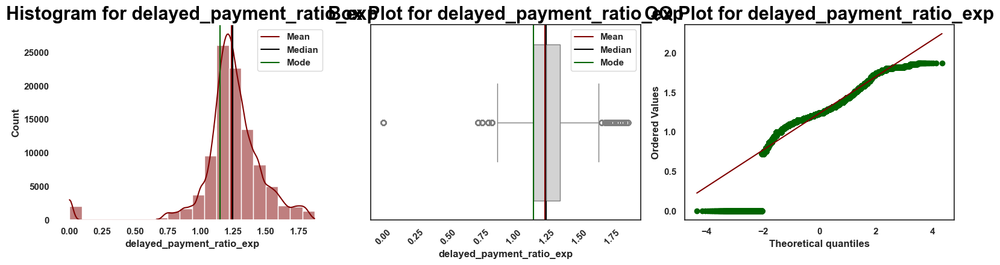



Skew for delayed_payment_ratio_exp is -1.99

Kurtosis for delayed_payment_ratio_exp is 9.26




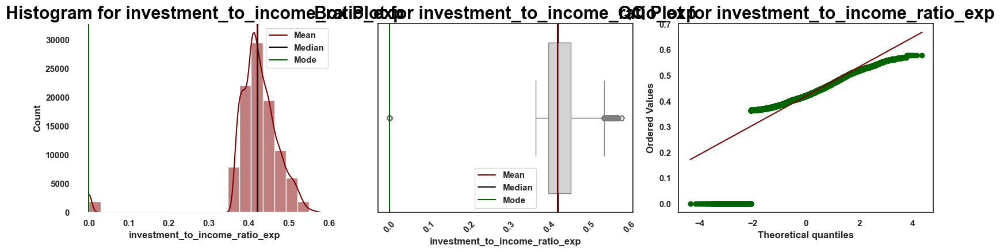



Skew for investment_to_income_ratio_exp is -3.76

Kurtosis for investment_to_income_ratio_exp is 20.98




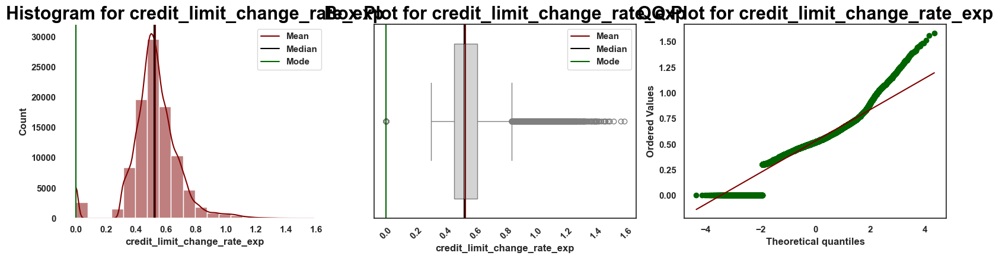



Skew for credit_limit_change_rate_exp is 0.01

Kurtosis for credit_limit_change_rate_exp is 3.75




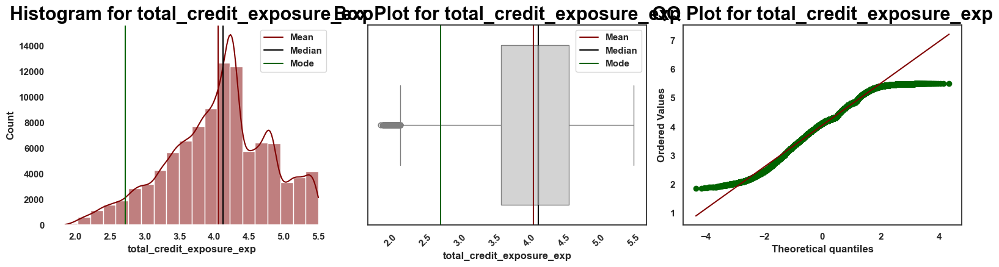



Skew for total_credit_exposure_exp is -0.29

Kurtosis for total_credit_exposure_exp is -0.22




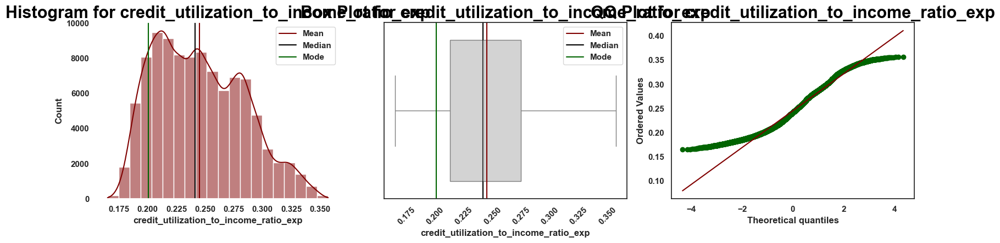



Skew for credit_utilization_to_income_ratio_exp is 0.39

Kurtosis for credit_utilization_to_income_ratio_exp is -0.63




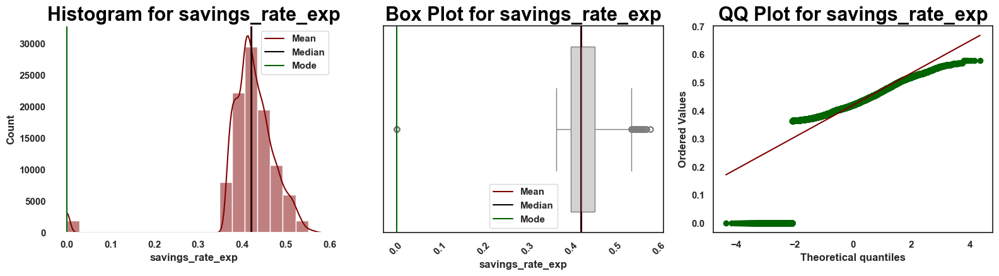



Skew for savings_rate_exp is -3.76

Kurtosis for savings_rate_exp is 20.96




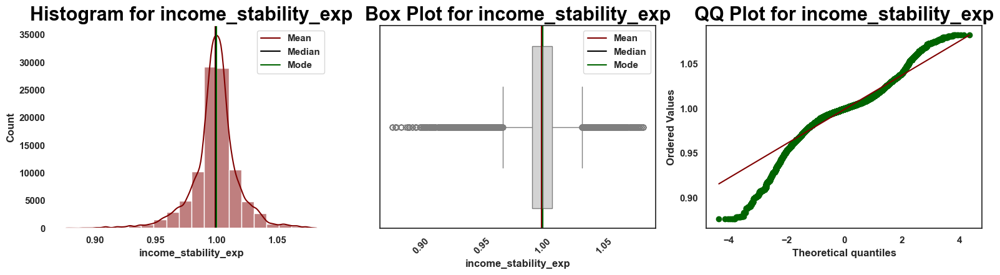



Skew for income_stability_exp is -0.55

Kurtosis for income_stability_exp is 3.90




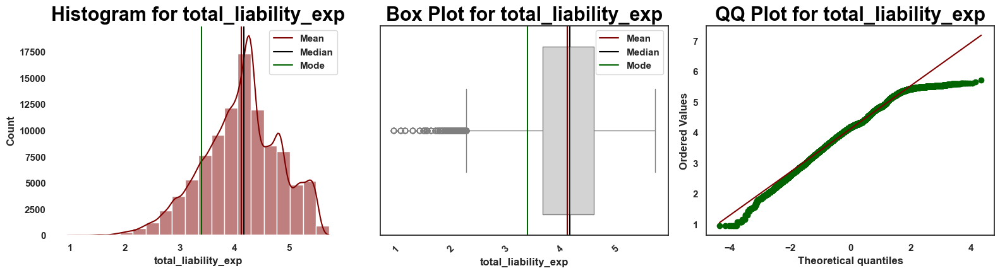



Skew for total_liability_exp is -0.30

Kurtosis for total_liability_exp is 0.00




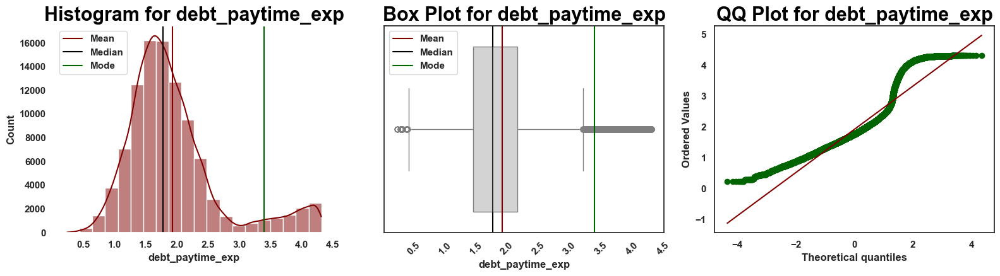



Skew for debt_paytime_exp is 1.41

Kurtosis for debt_paytime_exp is 1.99




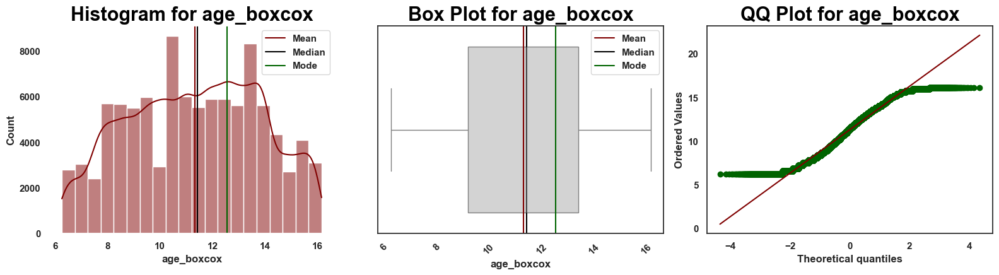



Skew for age_boxcox is -0.06

Kurtosis for age_boxcox is -0.94




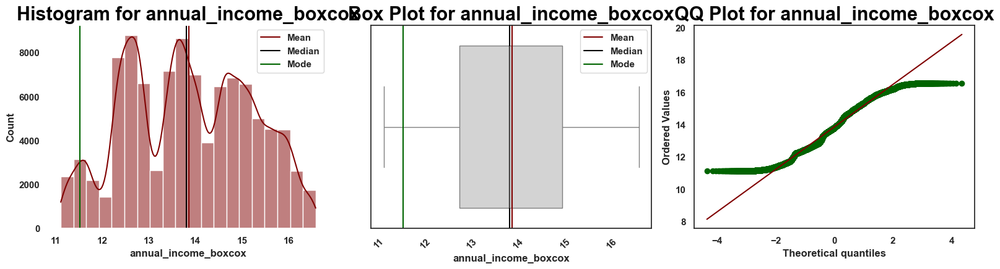



Skew for annual_income_boxcox is -0.01

Kurtosis for annual_income_boxcox is -0.93




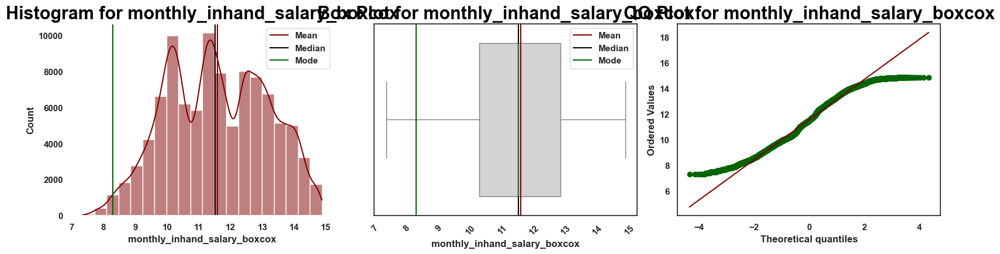



Skew for monthly_inhand_salary_boxcox is -0.02

Kurtosis for monthly_inhand_salary_boxcox is -0.84




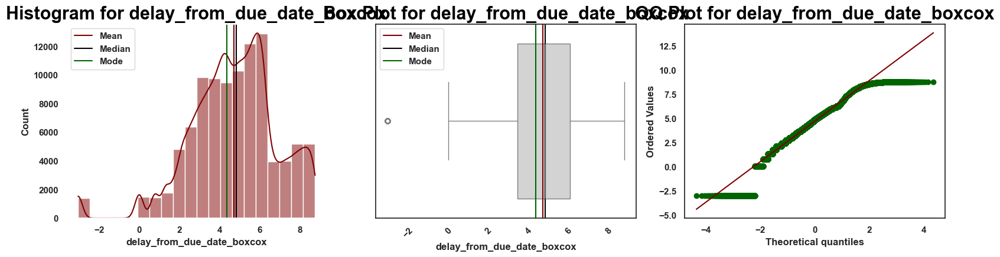



Skew for delay_from_due_date_boxcox is -0.59

Kurtosis for delay_from_due_date_boxcox is 1.19




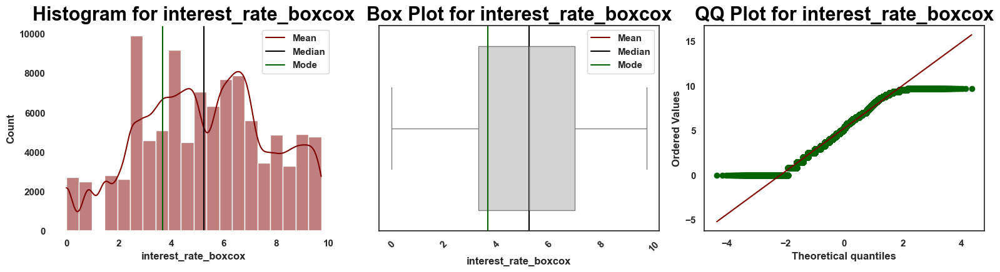



Skew for interest_rate_boxcox is -0.10

Kurtosis for interest_rate_boxcox is -0.72




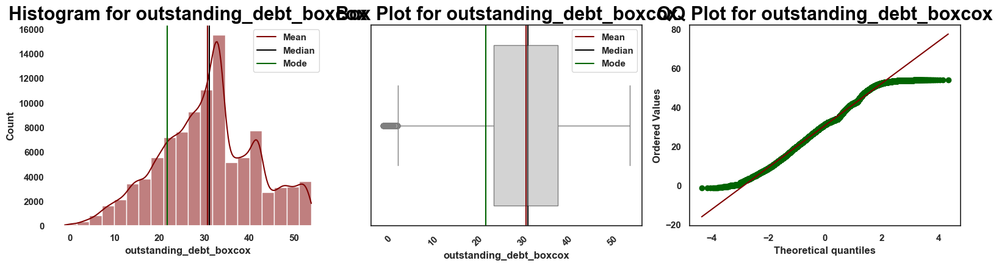



Skew for outstanding_debt_boxcox is -0.04

Kurtosis for outstanding_debt_boxcox is -0.29




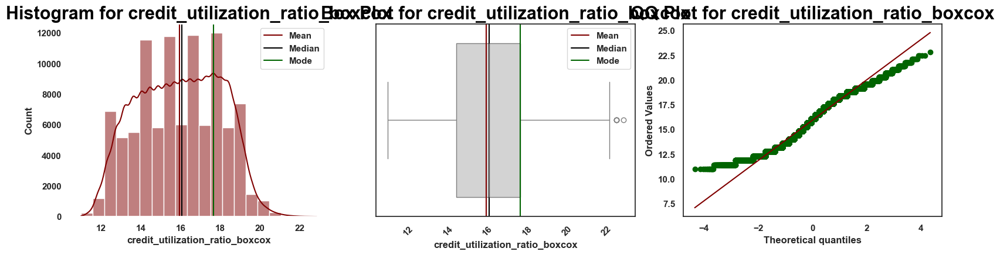



Skew for credit_utilization_ratio_boxcox is -0.04

Kurtosis for credit_utilization_ratio_boxcox is -0.95




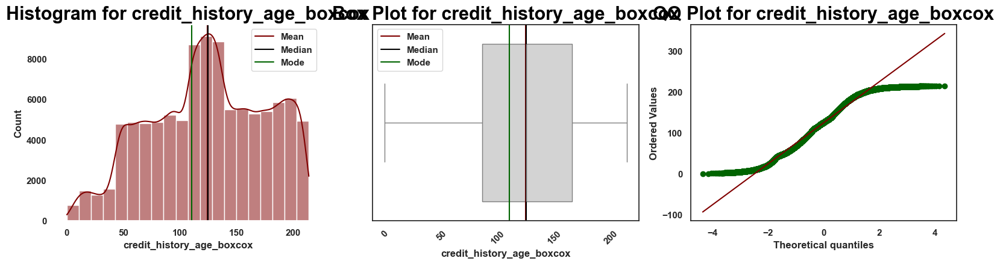



Skew for credit_history_age_boxcox is -0.17

Kurtosis for credit_history_age_boxcox is -0.80




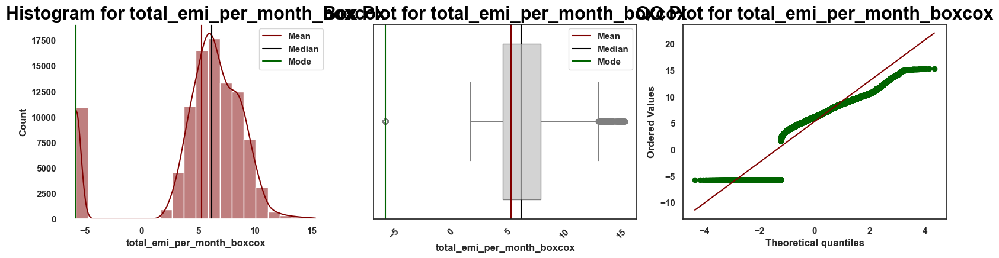



Skew for total_emi_per_month_boxcox is -1.57

Kurtosis for total_emi_per_month_boxcox is 1.94




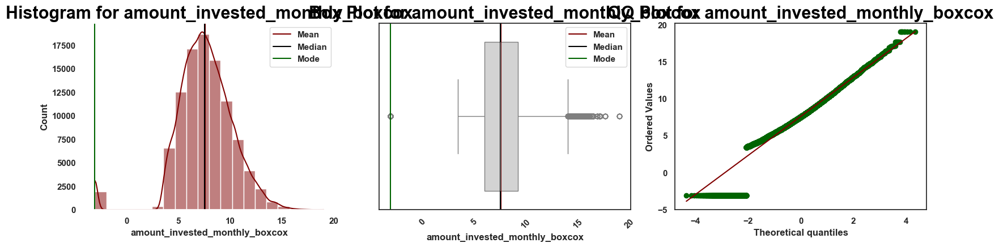



Skew for amount_invested_monthly_boxcox is -0.69

Kurtosis for amount_invested_monthly_boxcox is 3.20




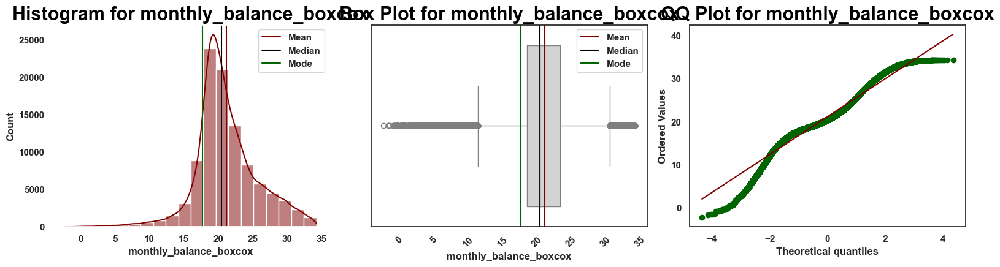



Skew for monthly_balance_boxcox is 0.13

Kurtosis for monthly_balance_boxcox is 1.45




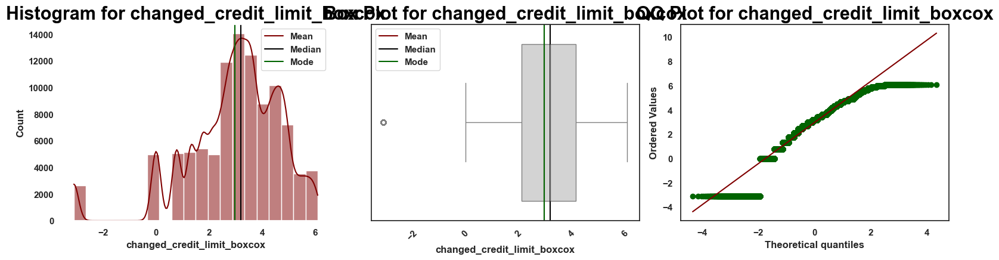



Skew for changed_credit_limit_boxcox is -1.06

Kurtosis for changed_credit_limit_boxcox is 1.94




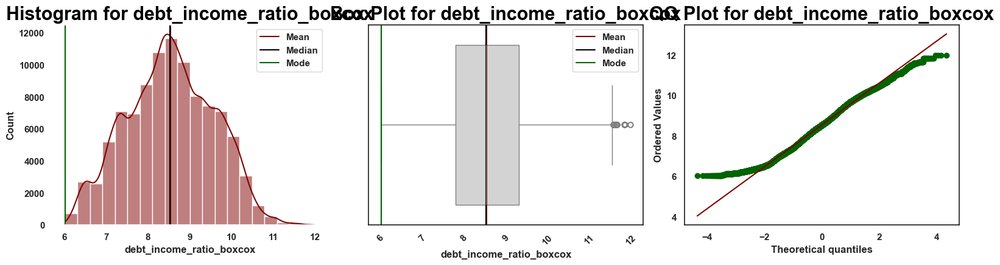



Skew for debt_income_ratio_boxcox is -0.00

Kurtosis for debt_income_ratio_boxcox is -0.56




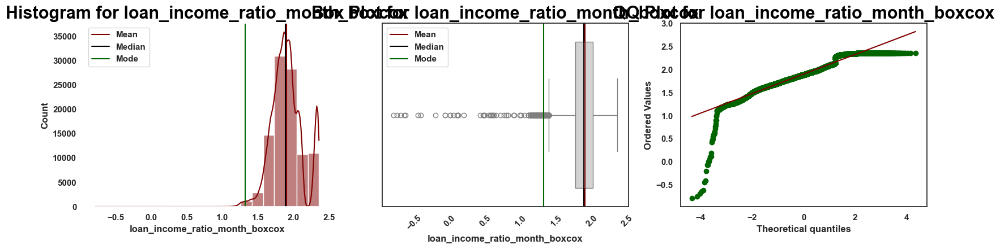



Skew for loan_income_ratio_month_boxcox is 0.00

Kurtosis for loan_income_ratio_month_boxcox is 2.25




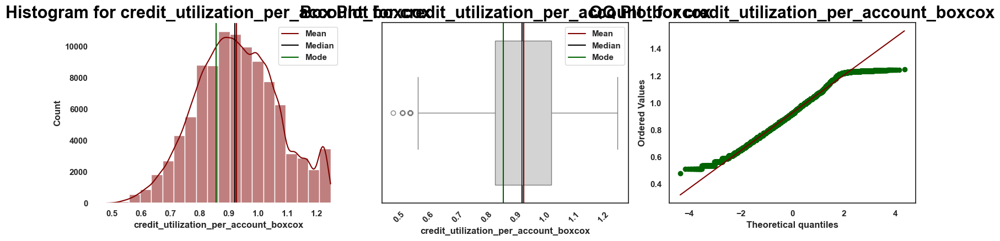



Skew for credit_utilization_per_account_boxcox is 0.08

Kurtosis for credit_utilization_per_account_boxcox is -0.34




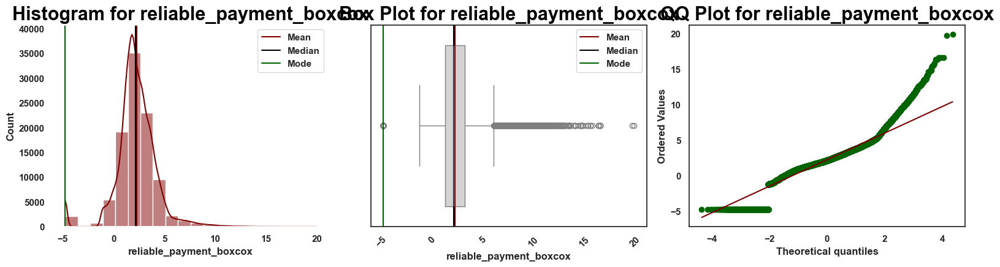



Skew for reliable_payment_boxcox is 0.02

Kurtosis for reliable_payment_boxcox is 4.92




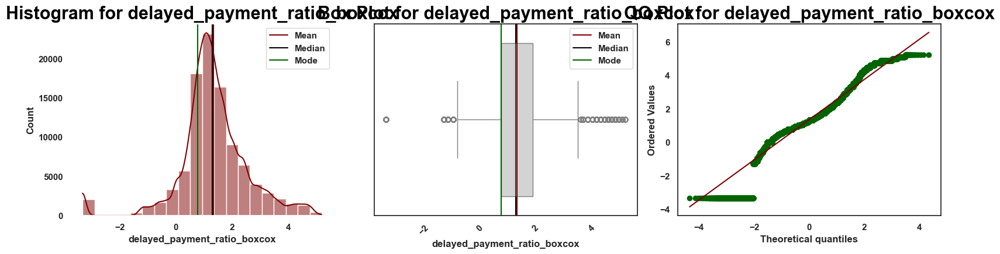



Skew for delayed_payment_ratio_boxcox is -0.49

Kurtosis for delayed_payment_ratio_boxcox is 3.36




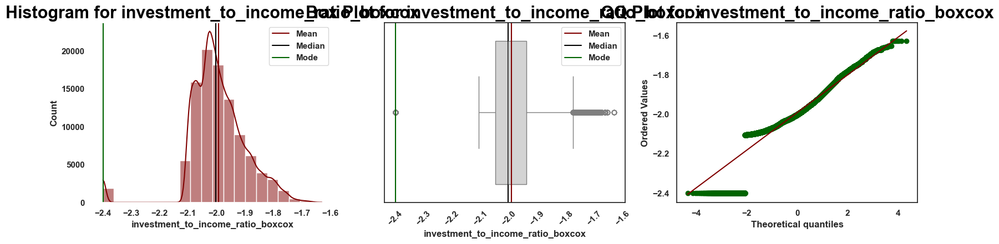



Skew for investment_to_income_ratio_boxcox is -0.65

Kurtosis for investment_to_income_ratio_boxcox is 4.02




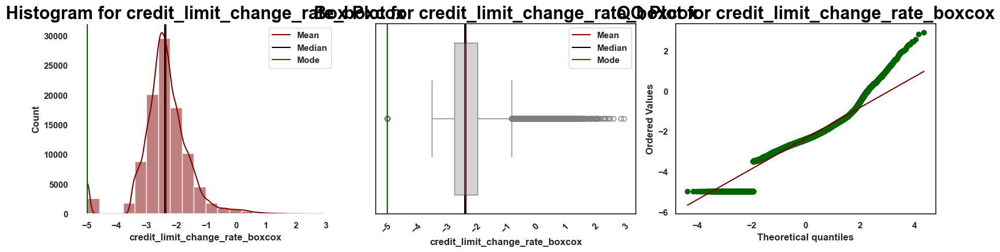



Skew for credit_limit_change_rate_boxcox is 0.03

Kurtosis for credit_limit_change_rate_boxcox is 3.73




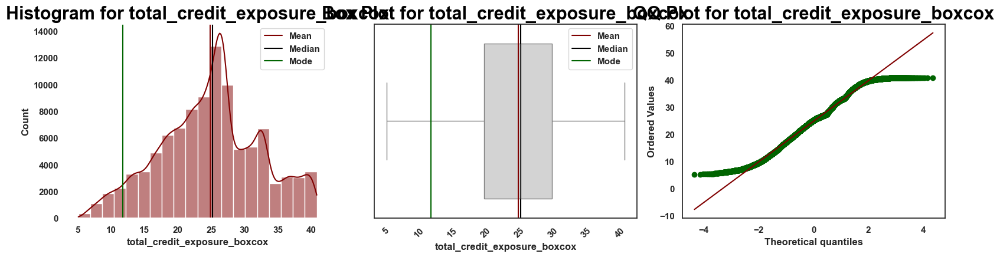



Skew for total_credit_exposure_boxcox is -0.04

Kurtosis for total_credit_exposure_boxcox is -0.39




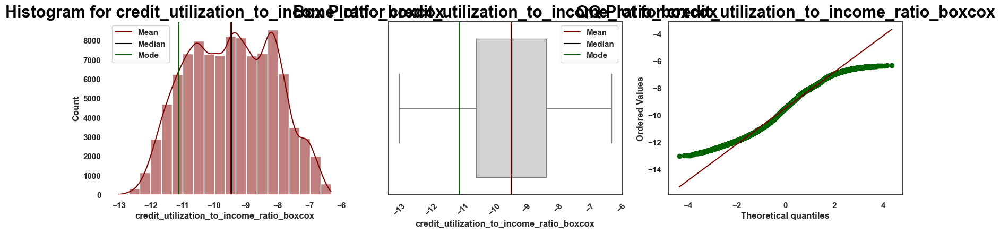



Skew for credit_utilization_to_income_ratio_boxcox is 0.02

Kurtosis for credit_utilization_to_income_ratio_boxcox is -0.88




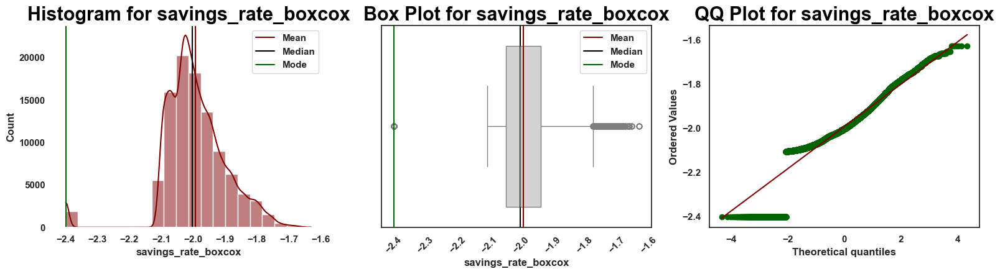



Skew for savings_rate_boxcox is -0.65

Kurtosis for savings_rate_boxcox is 4.02




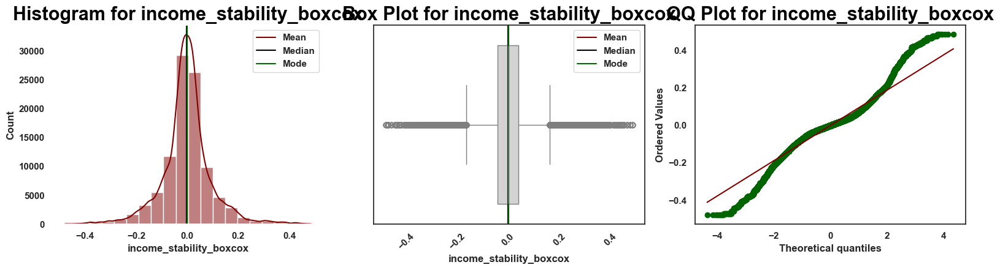



Skew for income_stability_boxcox is 0.11

Kurtosis for income_stability_boxcox is 3.28




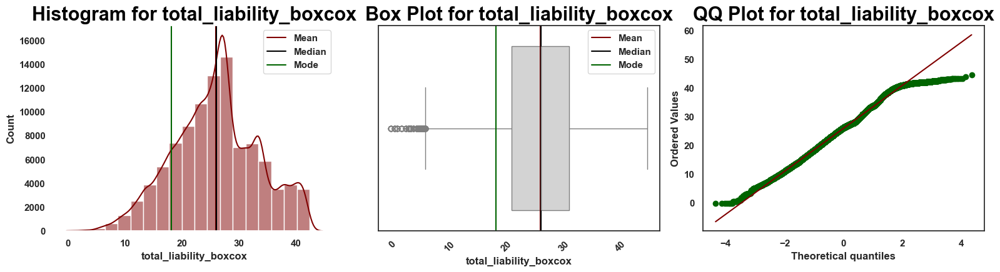



Skew for total_liability_boxcox is -0.03

Kurtosis for total_liability_boxcox is -0.29




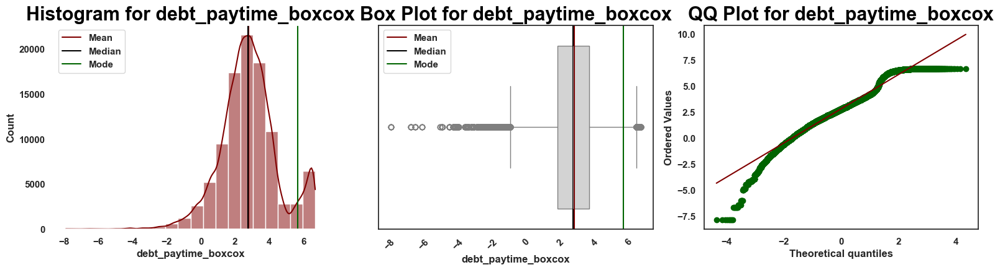



Skew for debt_paytime_boxcox is -0.01

Kurtosis for debt_paytime_boxcox is 1.06


Skewness:
 {'age_log': -0.38781153113328537, 'annual_income_log': -0.07525549569704983, 'monthly_inhand_salary_log': -0.13867620723883062, 'delay_from_due_date_log': -7.92538684484076, 'interest_rate_log': -1.0204643518732228, 'outstanding_debt_log': -1.4090811072172953, 'credit_utilization_ratio_log': -0.22864446734011104, 'credit_history_age_log': -1.8207162804718369, 'total_emi_per_month_log': -2.471455108361174, 'amount_invested_monthly_log': -6.860311727896503, 'monthly_balance_log': -1.9942153776858726, 'changed_credit_limit_log': -5.778638011155885, 'debt_income_ratio_log': -0.015355800390704912, 'loan_income_ratio_month_log': 1.8286611491238698, 'credit_utilization_per_account_log': 1.273088007877898, 'reliable_payment_log': -6.325714979743103, 'delayed_payment_ratio_log': -6.520424697048761, 'investment_to_income_ratio_log': -6.890029149271657, 'credit_limit_change_rate_log': -5.495368422252350

In [10]:
transformed_skewness = {}
transformed_kurtosis = {}
for i in normalized_df.columns:
    univar_num(normalized_df,i)
    skews=normalized_df[i].skew()
    kurt=normalized_df[i].kurtosis()
    transformed_skewness.update({i:skews})
    transformed_kurtosis.update({i:kurt})
    color = color_neutral
    if -0.5 <= skews <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skews <= 0.5 or -0.5 < skews < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
      
    print(f"\n\n{color}Skew for {i} is {skews:.2f}{color_neutral}")    
    print(f"\n{color}Kurtosis for {i} is {kurt:.2f}{color_neutral}\n\n")
print( 'Skewness:\n',transformed_skewness,'\n\n','Kurtois:\n',transformed_kurtosis)


<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> <b> Based on the skewness and kurtosis values, and distribution i have selected best transformation methods</span>

### <p Style="color: Khaki"> Creating the list of transformed features names:

In [9]:
transformed_features = [
    'age_boxcox',
    'annual_income_boxcox',
    'monthly_inhand_salary_boxcox',
    'interest_rate_boxcox',
    'outstanding_debt_square',
    'credit_utilization_ratio_log',
    'credit_history_age_boxcox',
    'changed_credit_limit_cube',
    'total_emi_per_month_square',
    'amount_invested_monthly_boxcox',
    'monthly_balance_boxcox',
    'credit_limit_change_rate_exp',
    'debt_income_ratio_log',
    'loan_income_ratio_month_boxcox',
    'credit_utilization_per_account_boxcox',
    'reliable_payment_boxcox',
    'delayed_payment_ratio_boxcox',
    'investment_to_income_ratio_square',
    'credit_limit_change_rate_boxcox',
    'total_credit_exposure_boxcox',
    'credit_utilization_to_income_ratio_boxcox',
    'savings_rate_rec',
    'income_stability_boxcox',
    'total_liability_boxcox',
    'debt_paytime_log'
]

original_features = [
    'age',
    'annual_income',
    'monthly_inhand_salary',
    'interest_rate',
    'outstanding_debt',
    'credit_utilization_ratio',
    'credit_history_age',
    'changed_credit_limit',
    'total_emi_per_month',
    'amount_invested_monthly',
    'monthly_balance',
    'credit_limit_change_rate',
    'debt_income_ratio',
    'loan_income_ratio_month',
    'credit_utilization_per_account',
    'reliable_payment',
    'delayed_payment_ratio',
    'investment_to_income_ratio',
    'credit_limit_change_rate',
    'total_credit_exposure',
    'credit_utilization_to_income_ratio',
    'savings_rate',
    'income_stability',
    'total_liability',
    'debt_paytime'
]

### <p Style="color: Khaki"> Adding transformed features to our dataframe:

In [10]:
df[transformed_features] = normalized_df[transformed_features]
df.drop(original_features,axis=1,inplace=True)

NameError: name 'normalized_df' is not defined

In [ ]:
df.to_feather('transfered_data.feather')
df

NameError: name 'df' is not defined

## <span style="color:Aqua;">Handling Outliers:</span> 

In [11]:
df1 = pd.read_feather('transfered_data.feather')

### <p Style="color: Khaki"> Outliers features list :

In [12]:
outliers = ['total_emi_per_month_square','amount_invested_monthly_boxcox','monthly_balance_boxcox','credit_limit_change_rate_exp','debt_income_ratio_log',
            'loan_income_ratio_month_boxcox','credit_utilization_per_account_boxcox','reliable_payment_boxcox','delayed_payment_ratio_boxcox','investment_to_income_ratio_square'
            ,'credit_limit_change_rate_boxcox','income_stability_boxcox','total_liability_boxcox','debt_paytime_log']

In [38]:
def cap_outliers(df, columns, iqr_factor=1.5):
    for column in columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        upper_threshold = Q3 + (iqr_factor * IQR)
        lower_threshold = Q1 - (iqr_factor * IQR)
        df[column] = df[column].clip(lower_threshold, upper_threshold)
    return df

In [39]:
df1_capped = cap_outliers(df1, outliers)


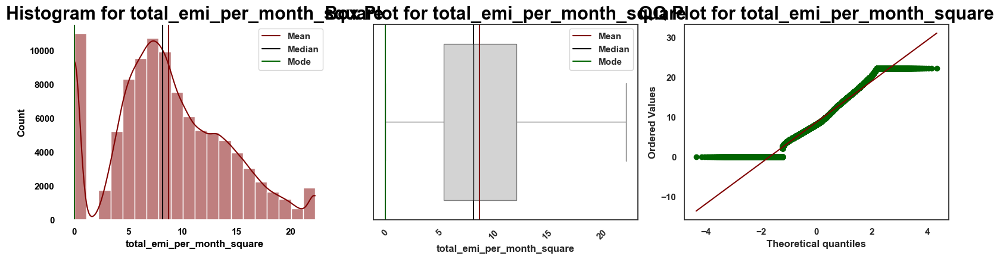

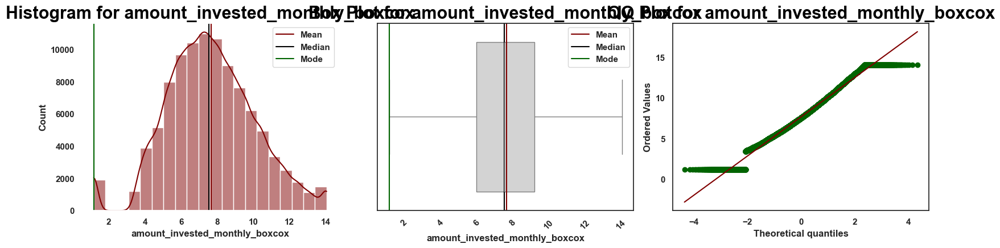

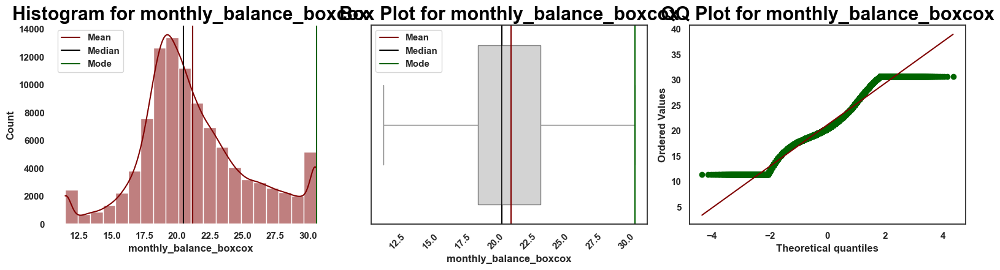

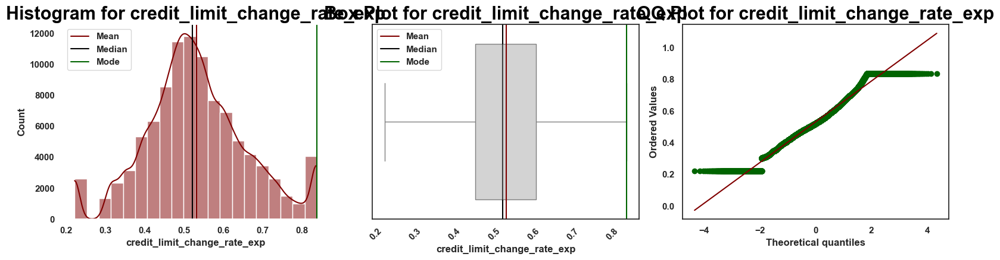

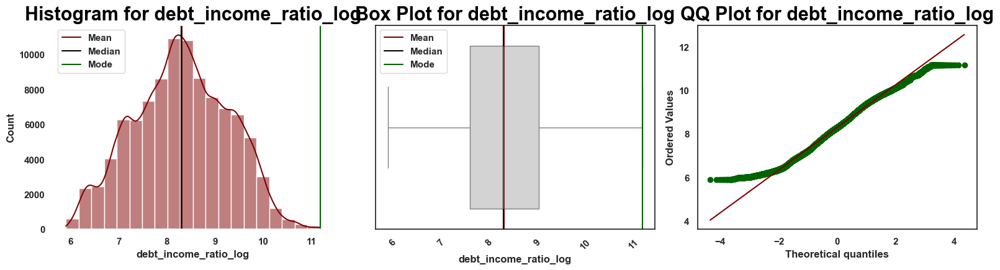

...

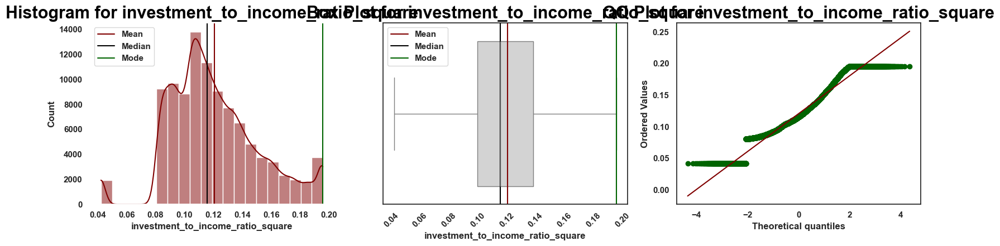

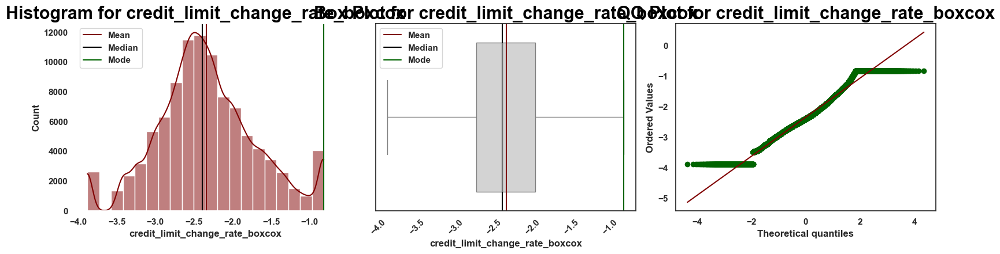

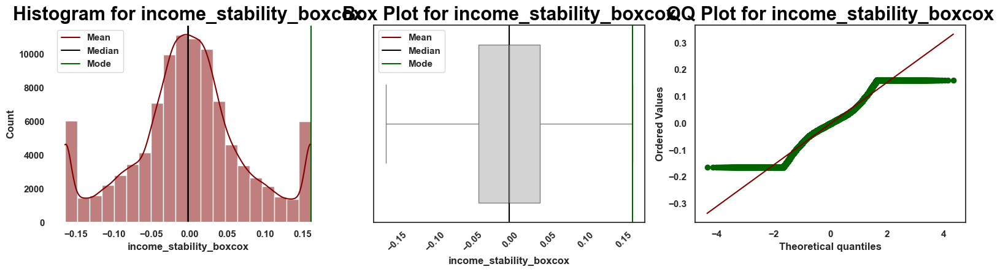

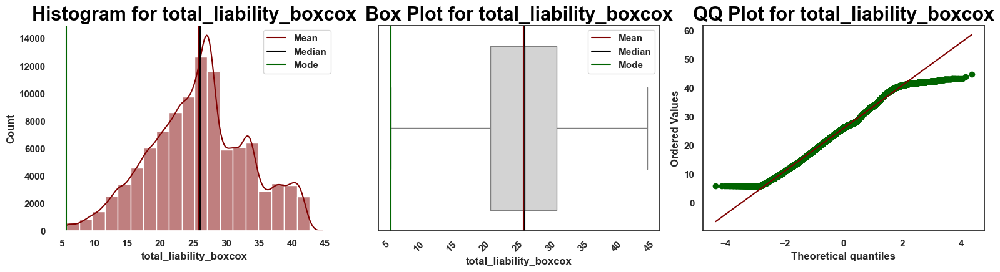

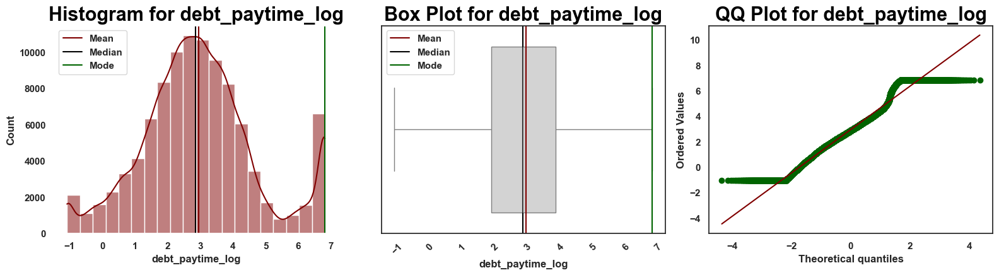

In [42]:
for col in outliers:
    univar_num(df1_capped, col)

In [43]:
df1_capped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 47 columns):
 #   Column                                     Non-Null Count   Dtype   
---  ------                                     --------------   -----   
 0   occupation                                 100000 non-null  category
 1   num_bank_accounts                          100000 non-null  int8    
 2   num_credit_card                            100000 non-null  int8    
 3   num_of_loan                                100000 non-null  int8    
 4   delay_from_due_date                        100000 non-null  int8    
 5   num_of_delayed_payment                     100000 non-null  int8    
 6   num_credit_inquiries                       100000 non-null  float64 
 7   credit_mix                                 100000 non-null  category
 8   payment_of_min_amount                      100000 non-null  category
 9   payment_behaviour                          100000 non-null  category
 1

In [44]:
df1_capped.to_feather('capped_df.feather')

## <span style="color:Aqua;"> Encoding Categorical Features:</span> 

### <span style="color:Khaki;">Reading capped Dataset:

In [50]:
df=pd.read_feather('capped_df.feather')
df.drop('occupation',axis=1,inplace=True)
df.sample(3)

,num_bank_accounts,num_credit_card,num_of_loan,delay_from_due_date,num_of_delayed_payment,num_credit_inquiries,credit_mix,payment_of_min_amount,payment_behaviour,credit_score,Mortgage Loan,Home Equity Loan,Credit-Builder Loan,Payday Loan,Personal Loan,Debt Consolidation Loan,Student Loan,Auto Loan,credit_inquiry_per_loan,age_group,disposable_income,age_boxcox,annual_income_boxcox,monthly_inhand_salary_boxcox,interest_rate_boxcox,outstanding_debt_square,credit_utilization_ratio_log,credit_history_age_boxcox,changed_credit_limit_cube,total_emi_per_month_square,amount_invested_monthly_boxcox,monthly_balance_boxcox,credit_limit_change_rate_exp,debt_income_ratio_log,loan_income_ratio_month_boxcox,credit_utilization_per_account_boxcox,reliable_payment_boxcox,delayed_payment_ratio_boxcox,investment_to_income_ratio_square,credit_limit_change_rate_boxcox,total_credit_exposure_boxcox,credit_utilization_to_income_ratio_boxcox,savings_rate_rec,income_stability_boxcox,total_liability_boxcox,debt_paytime_log
90516,8,5,6,26,13,16.0000,Standard,Yes,Low_Spent_Small_Value_Payments,Poor,0,0,1,0,1,0,0,1,3.0000,36-50,1243.6804,13.1913,12.3325,9.8639,9.3602,43.5434,3.2958,117.8300,47,7.7305,4.8433,18.6021,0.5922,7.1400,1.7323,0.7447,2.2574,0.6802,0.1187,-2.0366,29.5929,-8.1622,70.9066,0.0333,30.3543,3.4406
71587,7,7,6,28,21,9.0000,Bad,Nm,Low_Spent_Large_Value_Payments,Standard,0,1,0,1,0,1,1,1,2.0000,36-50,3920.9045,13.8166,14.2282,12.0483,8.6239,43.6155,3.4012,73.9784,87,11.5324,5.8331,20.2264,0.5646,8.1296,1.8218,0.8337,3.9114,1.3010,0.0807,-2.1740,29.6412,-9.9249,153.4274,0.0240,30.7700,2.6530
70678,3,7,0,7,7,2.0000,Good,Nm,High_Spent_Large_Value_Payments,Good,0,0,0,0,0,0,0,0,2.0000,50+,2658.9300,15.5929,13.4883,11.2118,2.0035,25.9908,3.4965,119.3470,51,0.0000,5.3713,22.9248,0.5549,8.2505,2.3133,1.0507,1.3825,2.6414,0.0918,-2.2221,20.9683,-9.0007,118.5668,0.0415,20.9589,6.5155


## <span style="color:Aqua;">Defining variable type</span> 

In [51]:
ordinal = ['credit_mix','payment_of_min_amount','payment_behaviour','credit_score','age_group']
nominal = ['occupation']
continuous = [
    'age_boxcox','annual_income_boxcox','monthly_inhand_salary_boxcox','interest_rate_boxcox','outstanding_debt_square',
    'credit_utilization_ratio_log','credit_history_age_boxcox','changed_credit_limit_cube','total_emi_per_month_square',
    'amount_invested_monthly_boxcox','monthly_balance_boxcox','credit_limit_change_rate_exp','debt_income_ratio_log',
    'loan_income_ratio_month_boxcox','credit_utilization_per_account_boxcox','reliable_payment_boxcox','delayed_payment_ratio_boxcox',
    'investment_to_income_ratio_square','credit_limit_change_rate_boxcox','total_credit_exposure_boxcox','credit_utilization_to_income_ratio_boxcox',
    'savings_rate_rec','income_stability_boxcox','total_liability_boxcox','debt_paytime_log'
]



## <span style="color:Aqua;"> Encoding Categorical Features:</span> 

### <span style="color:Khaki;">Creating Mapping dictionaries:

In [52]:
for col in ordinal:
    print(df[col].value_counts())

credit_mix
Standard    45848
Good        30384
Bad         23768
Name: count, dtype: int64
payment_of_min_amount
Yes    52326
No     35667
Nm     12007
Name: count, dtype: int64
payment_behaviour
Low_Spent_Small_Value_Payments      28616
High_Spent_Medium_Value_Payments    19738
High_Spent_Large_Value_Payments     14726
Low_Spent_Medium_Value_Payments     14399
High_Spent_Small_Value_Payments     11764
Low_Spent_Large_Value_Payments      10757
Name: count, dtype: int64
credit_score
Standard    53174
Poor        28998
Good        17828
Name: count, dtype: int64
age_group
36-50    35483
26-35    29142
18-25    19850
<18       8295
50+       7230
Name: count, dtype: int64


In [53]:
Credit_Mix_map = { 'Poor': 0,'Bad':0, 'Standard':1, 'Good': 2  }
Payment_of_Min_Amount_map = { 'No':0, 'Nm':1, 'Yes':2 }
Payment_Behaviour_map = { 'Low_Spent_Small_Value_Payments': 0 , 'Low_Spent_Medium_Value_Payments':1, 'Low_Spent_Large_Value_Payments':2,
                         'High_Spent_Small_Value_Payments':3, 'High_Spent_Medium_Value_Payments':4, 'High_Spent_Large_Value_Payments':5
                        }
age_group_map = {'<18': 0, '18-25': 1, '26-35': 2, '36-50': 3, '50+': 4,}

In [54]:
df['credit_mix'] = pd.to_numeric(df['credit_mix'].map(Credit_Mix_map),downcast='integer')
df['payment_of_min_amount'] = pd.to_numeric(df['payment_of_min_amount'].map(Payment_of_Min_Amount_map),downcast='integer')
df['payment_behaviour'] = pd.to_numeric(df['payment_behaviour'].map(Payment_Behaviour_map),downcast='integer')
df['credit_score'] = pd.to_numeric(df['credit_score'].map(Credit_Mix_map),downcast='integer')
df['age_group'] = pd.to_numeric(df['age_group'].map(age_group_map),downcast='integer')

In [55]:
for col in ordinal:
    print(df[col].value_counts())

credit_mix
1    45848
2    30384
0    23768
Name: count, dtype: int64
payment_of_min_amount
2    52326
0    35667
1    12007
Name: count, dtype: int64
payment_behaviour
0    28616
4    19738
5    14726
1    14399
3    11764
2    10757
Name: count, dtype: int64
credit_score
1    53174
0    28998
2    17828
Name: count, dtype: int64
age_group
3    35483
2    29142
1    19850
0     8295
4     7230
Name: count, dtype: int64


In [56]:
df.describe()

,num_bank_accounts,num_credit_card,num_of_loan,delay_from_due_date,num_of_delayed_payment,num_credit_inquiries,credit_mix,payment_of_min_amount,payment_behaviour,credit_score,Mortgage Loan,Home Equity Loan,Credit-Builder Loan,Payday Loan,Personal Loan,Debt Consolidation Loan,Student Loan,Auto Loan,credit_inquiry_per_loan,age_group,disposable_income,age_boxcox,annual_income_boxcox,monthly_inhand_salary_boxcox,interest_rate_boxcox,outstanding_debt_square,credit_utilization_ratio_log,credit_history_age_boxcox,changed_credit_limit_cube,total_emi_per_month_square,amount_invested_monthly_boxcox,monthly_balance_boxcox,credit_limit_change_rate_exp,debt_income_ratio_log,loan_income_ratio_month_boxcox,credit_utilization_per_account_boxcox,reliable_payment_boxcox,delayed_payment_ratio_boxcox,investment_to_income_ratio_square,credit_limit_change_rate_boxcox,total_credit_exposure_boxcox,credit_utilization_to_income_ratio_boxcox,savings_rate_rec,income_stability_boxcox,total_liability_boxcox,debt_paytime_log
count,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000,100000.0000
mean,5.3688,5.5336,3.5329,21.0814,13.3131,5.7983,1.0662,1.1666,2.2379,0.8883,0.3136,0.3140,0.3173,0.3194,0.3110,0.3104,0.3104,0.3056,1.8403,2.1350,4089.5716,11.3209,13.8608,11.5778,5.2516,34.6016,3.4457,124.3568,5.5901,8.7194,7.6677,21.1963,0.5315,8.3038,1.9034,0.9265,2.2679,1.3640,0.1207,-2.3385,24.8256,-9.4823,76.0148,-0.0019,25.9091,2.9474
std,2.5933,2.0671,2.4464,14.8046,6.2372,3.8678,0.7329,0.9231,1.8613,0.6751,0.4640,0.4641,0.4654,0.4663,0.4629,0.4627,0.4627,0.4607,1.2931,1.0752,3132.9336,2.5192,1.3315,1.5769,2.4293,15.1312,0.1644,50.7896,57.1509,5.2116,2.4281,4.1683,0.1295,0.9835,0.2104,0.1398,1.5732,1.0182,0.0306,0.6454,7.5147,1.3524,34.1407,0.0780,7.5197,1.7311
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-863.3358,6.2613,11.1147,7.3497,0.0000,0.4796,2.9957,0.0000,-121.0000,0.0000,1.1662,11.4435,0.2219,5.9041,1.3983,0.5390,-1.5196,-0.9242,0.0422,-3.8818,5.1299,-13.0149,0.0000,-0.1647,5.7747,-1.0786
25%,3.0000,4.0000,2.0000,10.0000,9.0000,3.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1579.0700,9.2002,12.7298,10.2740,3.2999,23.7923,3.3322,86.2900,-39.0000,5.4101,5.9981,18.6373,0.4525,7.6063,1.7683,0.8287,1.3281,0.7704,0.0997,-2.7325,19.7526,-10.5776,50.8176,-0.0425,20.8762,1.8817
50%,5.0000,5.0000,3.0000,18.0000,14.0000,5.0000,1.0000,2.0000,2.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.0000,2.0000,3016.5687,11.4226,13.8046,11.5101,5.2293,34.1490,3.4657,124.8856,0.0000,8.1524,7.5257,20.4546,0.5212,8.3015,1.8874,0.9207,2.1474,1.3010,0.1155,-2.3903,25.1749,-9.4678,73.2512,-0.0016,26.0852,2.8589
75%,7.0000,7.0000,5.0000,28.0000,18.0000,8.0000,2.0000,2.0000,4.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,2.0000,3.0000,5785.1548,13.4018,14.9368,12.8384,6.9734,44.1131,3.5835,165.6512,51.0000,12.1405,9.2194,23.4331,0.6063,9.0341,2.0151,1.0218,3.2265,1.9001,0.1381,-1.9663,29.8719,-8.3755,96.9042,0.0390,30.9438,3.8552
max,11.0000,11.0000,9.0000,62.0000,25.0000,17.0000,2.0000,2.0000,5.0000,2.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,12.0000,4.0000,15101.9400,16.1564,16.5758,14.8721,9.7112,70.6970,3.9120,213.8333,125.0000,22.2362,14.0514,30.6269,0.8369,11.1759,2.3598,1.2477,6.0742,3.5947,0.1957,-0.8171,40.8020,-6.3219,154.0589,0.1612,44.6478,6.8156


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 46 columns):
 #   Column                                     Non-Null Count   Dtype  
---  ------                                     --------------   -----  
 0   num_bank_accounts                          100000 non-null  int8   
 1   num_credit_card                            100000 non-null  int8   
 2   num_of_loan                                100000 non-null  int8   
 3   delay_from_due_date                        100000 non-null  int8   
 4   num_of_delayed_payment                     100000 non-null  int8   
 5   num_credit_inquiries                       100000 non-null  float64
 6   credit_mix                                 100000 non-null  int8   
 7   payment_of_min_amount                      100000 non-null  int8   
 8   payment_behaviour                          100000 non-null  int8   
 9   credit_score                               100000 non-null  int8   
 10  Mortgage 

In [58]:
df.to_feather('model_ready.feather')